In [3]:
import nltk
import math
import os
import sys
import pickle
import string
import operator
import numpy as np
import pandas as pd
from collections import Counter
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
from nltk.stem.wordnet import WordNetLemmatizer

**Read From Paths and create dataframe**

In [4]:
def readFromPath(path, folders_to_scan):
    print("Entering readFromPath")
    document_dict = {}
    doc_length_dict = {}
    actual_file_label = []
    text = []
    for foldername in os.listdir(path):
        if os.path.isdir(path+"/"+foldername) and foldername in folders_to_scan:
            complete_path = path+"/"+ foldername
            for filename in os.listdir(complete_path):
                f = open(complete_path+"/"+filename, errors="ignore")
                data = f.read()
                                
                tokens = nltk.word_tokenize(data) # Tokenize the data of the file
                stripped = removePunctuation(tokens) # Punctuation removal
                lemmatized_words = lemmatization(stripped) # Lemmatization
                filtered_words = removeStopwords(lemmatized_words) # Stopword Removal
                filtered_words[:] = [x for x in filtered_words if x]
                text.append(filtered_words)
                actual_file_label.append(foldername)
    
    print(len(text))
    print(len(actual_file_label))
    df_text = pd.DataFrame([text, actual_file_label]).T
    print(df_text)
    df_text.to_pickle("df_text")    

**Remove Punctuation**

In [5]:
# Removal of punctuations from the tokens list
def removePunctuation(tokens):
    table = str.maketrans('', '', string.punctuation)
    stripped = [w.translate(table) for w in tokens]
    return stripped

**Remove Stopwords**

In [6]:
# Removal of stopwords from the tokens list
def removeStopwords(text_list):
    stop_words=set(stopwords.words("english"))
    filtered_text = []
    for w in text_list:
        if w not in stop_words:
            filtered_text.append(w)
    return filtered_text

**Lowercase conversion and lemmatization**

In [7]:
# Lowercase conversion
# Lemmatizing the words present in the list containing text
def lemmatization(text_list):
    lem = WordNetLemmatizer()
    lemmatized_words = []
    for w in text_list:
        w = w.lower()
        word = lem.lemmatize(w)
        lemmatized_words.append(word)
    return lemmatized_words

**Read from required folders**

In [8]:
folders_to_scan = ['comp.graphics', 'sci.med', 'talk.politics.misc', 'rec.sport.hockey', 'sci.space']
path = os.getcwd() + '\\20_newsgroups'

In [9]:
readFromPath(path, folders_to_scan)

Entering readFromPath
5000
5000
                                                      0                   1
0     [xref, cantaloupesrvcscmuedu, compgraphics3726...       comp.graphics
1     [path, cantaloupesrvcscmuedu, crabapplesrvcscm...       comp.graphics
2     [path, cantaloupesrvcscmuedu, dasnewsharvarded...       comp.graphics
3     [xref, cantaloupesrvcscmuedu, comphumanfactors...       comp.graphics
4     [path, cantaloupesrvcscmuedu, crabapplesrvcscm...       comp.graphics
...                                                 ...                 ...
4995  [xref, cantaloupesrvcscmuedu, misclegal61051, ...  talk.politics.misc
4996  [xref, cantaloupesrvcscmuedu, talkpoliticsmisc...  talk.politics.misc
4997  [xref, cantaloupesrvcscmuedu, talkpoliticsmisc...  talk.politics.misc
4998  [path, cantaloupesrvcscmuedu, crabapplesrvcscm...  talk.politics.misc
4999  [xref, cantaloupesrvcscmuedu, altpoliticsclint...  talk.politics.misc

[5000 rows x 2 columns]


**Function to divide the data into training and testing**

In [10]:
def divide_data(train_ratio):
    df_text = pd.read_pickle("df_text")
    df_train = df_text.sample(frac=train_ratio,random_state = 43)
    df_test = df_text.sample(frac=1,random_state = 43).drop(df_train.index)
    
    df_train = df_train.reset_index(drop=True)
    df_test = df_test.reset_index(drop=True)
    print(df_test)
    return df_train, df_test

In [11]:
trainingData, testingData = divide_data(0.7)

                                                      0                   1
0     [xref, cantaloupesrvcscmuedu, scispace61483, s...           sci.space
1     [path, cantaloupesrvcscmuedu, magnesiumclubccc...           sci.space
2     [path, cantaloupesrvcscmuedu, crabapplesrvcscm...             sci.med
3     [path, cantaloupesrvcscmuedu, magnesiumclubccc...           sci.space
4     [xref, cantaloupesrvcscmuedu, talkpoliticsmisc...  talk.politics.misc
...                                                 ...                 ...
1495  [path, cantaloupesrvcscmuedu, crabapplesrvcscm...       comp.graphics
1496  [path, cantaloupesrvcscmuedu, dasnewsharvarded...             sci.med
1497  [xref, cantaloupesrvcscmuedu, scimed58963, sci...             sci.med
1498  [newsgroups, scimed, path, cantaloupesrvcscmue...             sci.med
1499  [newsgroups, scispace, path, cantaloupesrvcscm...           sci.space

[1500 rows x 2 columns]


In [12]:
print(len(testingData))

1500


# Naive Bayes-TfIdf

In [13]:
def findPriorProb(folders_to_scan):
    prior_prob = {}
    class_doc_count_dict = {}
    for folder in folders_to_scan:
        count = 0
        for i in range(len(trainingData)):
            if trainingData[1][i] == folder:
                count += 1
        prior_prob[folder] = count/len(trainingData)
        class_doc_count_dict[folder] = count
    return prior_prob, class_doc_count_dict

In [14]:
prior_prob, class_doc_count_dict = findPriorProb(folders_to_scan)
print(class_doc_count_dict)

{'comp.graphics': 705, 'sci.med': 698, 'talk.politics.misc': 699, 'rec.sport.hockey': 720, 'sci.space': 678}


**Create Class wise Corpus**

In [15]:
def createClassWiseCorpus(trainData):
    corpus_dict = {}
    for folder in folders_to_scan:
        corpus = []
        for i in range(len(trainingData)):
            if trainData[1][i] == folder:
                corpus.extend(trainData[0][i])
        corpus_dict[folder] = corpus
    return corpus_dict

In [16]:
classWiseCorpus = createClassWiseCorpus(trainingData)
print(len(classWiseCorpus['comp.graphics']))

140050


**Create Tf on the classwisecorpus**

In [17]:
def findTf(corpus):
    folder_tf_dict = {}
    for folder in corpus.keys():
        tf_dict = {}
        vocabulary_list = corpus[folder]
        for word in set(vocabulary_list):
            tf = vocabulary_list.count(word)
            tf_dict[word] = tf
        folder_tf_dict[folder] = tf_dict
    return folder_tf_dict

In [18]:
folder_tf_dict = findTf(classWiseCorpus)
#print(folder_tf_dict)

{'comp.graphics': {'funded': 7, 'utility': 69, 'hobbesphysicsuiowaedu': 1, 'erratic': 1, 'complangmisc': 1, '100200100': 1, 'dozen': 1, 'postscriptbased': 1, 'sixth': 6, '5000': 9, 'aws': 1, 'xpi': 1, 'programmeranalyst': 3, '220701': 1, 'barton': 1, '144': 3, 'lesterappstateedu': 1, 'announced': 10, 'siltanen': 4, 'aalborg': 2, 'originally': 13, 'huntsville': 4, 'c52vyc7k2': 1, 'transaction': 9, 'british': 5, 'birmingham': 11, 'pubpcwin3desktopcview097zip': 3, '160935': 1, 'poon': 2, 'ga': 7, 'haifa': 1, 'c5y443eoe': 1, 'tek': 2, 'communicates': 1, 'tseng': 8, 'encoder': 1, 'acs6acsucalgaryca': 3, 'convolu': 2, 'importing': 1, 'monu1ccmonasheduau': 1, '9304051103aa01274': 1, '225742': 1, 'ly': 5, 'kbytess': 1, 'oy': 2, '99': 6, 'wrigley': 1, '3105239393': 1, 'wisdomattmailcom': 2, 'tcl': 3, 'smarshall': 1, 'call': 64, 'kettlezip': 1, 'modula': 1, 'ada': 1, '1meg': 2, 'passthrough': 2, 'contemporary': 1, 'compsysibmpcmisc34092': 1, 'v1n2': 1, 'geomview': 3, 'tp892275735534160': 1, 'pho

In [1]:
def savePickle(dictionary, name):
    pickle_out= open(name+".pickle","wb")
    pickle.dump(dictionary, pickle_out)
    pickle_out.close()

In [2]:
def loadPickle(name):
    pickle_in = open(name+".pickle","rb")
    dictionary=pickle.load(pickle_in)
    pickle_in.close()
    return dictionary

In [19]:
savePickle(folder_tf_dict, "folder_tf_dict")

**Create Document Frequency on universal vocabulary**

In [20]:
def findDf(corpus):
    folder_df_dict = {}
    universal_vocab = set()
    for folder in corpus.keys():
        vocabulary = corpus[folder]
        universal_vocab = universal_vocab | set(vocabulary)
    print("Created universal vocabulary!!!!")
    print("Universal Vocabulary:",universal_vocab)
    for folder in corpus.keys():
        vocabulary = corpus[folder]
        for word in universal_vocab:
            if word in vocabulary:
                if word in folder_df_dict.keys():
                    folder_df_dict[word] = folder_df_dict[word] + 1
                else:
                    folder_df_dict[word] = 1
    return folder_df_dict,universal_vocab

In [22]:
folder_df_dict,universal_vocab = findDf(classWiseCorpus)
print(folder_df_dict['graphic'])

Created universal vocabulary!!!!
Universal Vocabulary: {'motorvoter', 'hobbesphysicsuiowaedu', 'roche', 'minimmize', 'schwarz', 'misclegal60983', 'sixth', 'aws', 'credibility', 'exgod', 'celestial', 'lesterappstateedu', 'hollis', 'sensation', 'pubpcwin3desktopcview097zip', 'c52vyc7k2', 'semiauto', 'adonis', 'tribal', 'ul', 'talkabortion118653', 'haifa', 'burecratic', 'c5y443eoe', 'pdb059160493111229', 'privatization', 'encoder', 'acs6acsucalgaryca', 'igorlarionov', 'chloride', '1118', 'kbytess', 'folly', 'qualcommcom', 'socmen68556', 'eskimocom', 'furey', '1meg', 'somerville', 'authored', 'daypro', 'cardiothoracic', 'compsysibmpcmisc34092', '1993apr1523573312837', 'sciastro35186', 'jyusenkyoucsjhuedu', 'geneticics', 'mostfrequently', 'recurs', 'djf', 'spineless', 'connaught', 'indistinguishable', '002326', '31185', 'demented', '1993apr2214392926131', 'pbk', '183712', 'reacts', 'partway', '30odd', 'overland', 'scimed59028', 'altgraphics519', 'fncrd6fnalgov', 'c5qmjjyb', 'winningcompetit

4


In [23]:
savePickle(folder_df_dict, "folder_df_dict")

**Find Tf-idf value on classwise corpus**

In [24]:
def findTfIdf(folder_tf_dict,folder_df_dict):
    total_no_of_classes = len(folder_tf_dict.keys())
    folder_tf_idf_dict = {}
    for folder in folder_tf_dict.keys():
        size_of_folder = class_doc_count_dict[folder]
        print("size_of_folder:",size_of_folder)
        tf_dict = folder_tf_dict[folder]
        tf_idf_dict = {}
        for word in tf_dict.keys():
            tf = tf_dict[word]
            normalizedTf = tf/size_of_folder
            df = folder_df_dict[word]
            idf = 1 + math.log10(total_no_of_classes/df)
            tf_idf = normalizedTf * idf
            tf_idf_dict[word] = tf_idf
        folder_tf_idf_dict[folder] = tf_idf_dict
    return folder_tf_idf_dict

In [25]:
folder_tf_idf_dict = findTfIdf(folder_tf_dict,folder_df_dict)

size_of_folder: 705
size_of_folder: 698
size_of_folder: 699
size_of_folder: 720
size_of_folder: 678


In [26]:
savePickle(folder_tf_idf_dict, "folder_tf_idf_dict")

In [27]:
def sortTfIdf(folder_tf_idf_dict):
    for folder in folder_tf_idf_dict.keys():
        tf_idf_dict = folder_tf_idf_dict[folder]
        sorted_tf_idf_dict = dict(sorted(tf_idf_dict.items(), key=operator.itemgetter(1), reverse = True))
        folder_tf_idf_dict[folder] = sorted_tf_idf_dict
    return folder_tf_idf_dict

In [28]:
folder_tf_idf_dict1 = sortTfIdf(folder_tf_idf_dict)
print(folder_tf_idf_dict1['comp.graphics'])

folder: comp.graphics
<class 'dict'>
folder: sci.med
<class 'dict'>
folder: talk.politics.misc
<class 'dict'>
folder: rec.sport.hockey
<class 'dict'>
folder: sci.space
<class 'dict'>
{'image': 2.276282764582676, 'jpeg': 1.378111072378817, 'line': 1.3546099290780143, 'compgraphics': 1.3414339463873188, 'cantaloupesrvcscmuedu': 1.326241134751773, 'file': 1.3035460992907801, 'subject': 1.097872340425532, 'date': 1.0354609929078014, 'newsgroups': 1.0283687943262412, 'path': 1.0212765957446808, 'organization': 1.0070921985815602, 'messageid': 1.0, 'graphic': 0.9008665213215101, 'apr': 0.8964539007092198, 'gmt': 0.8780141843971632, 'nt': 0.8595744680851064, 'format': 0.7730496453900709, '1993': 0.7602836879432624, 'program': 0.7262411347517731, 'system': 0.6567375886524822, 'would': 0.6539007092198581, 'gif': 0.6377877161118002, 'university': 0.6283687943262412, 'software': 0.625531914893617, 'version': 0.5943262411347517, 'ha': 0.5900709219858156, 'doe': 0.5801418439716312, 'color': 0.57304

**Find top k on basis of Tf-idf value**

In [29]:
def findTopK(folder_tf_idf_dic,k):
    size_dict = {}
    for folder in folder_tf_idf_dic.keys():
        tf_idf_dict = folder_tf_idf_dic[folder]
        size_dict[folder] = len(tf_idf_dict)
    sorted_size_dict = sorted(size_dict.items(), key=operator.itemgetter(1))
    print(sorted_size_dict)
    #minimum_size = sorted_size_dict[0][1]*k
    #print("minimum_size:",int(minimum_size))
    minimum_size = 10000
    for folder in folder_tf_idf_dic.keys():
        tf_idf_dict = folder_tf_idf_dic[folder]
        res = dict(sorted(tf_idf_dict.items(), key = operator.itemgetter(1), reverse = True)[:int(minimum_size)]) 
        print(len(res))
        folder_tf_idf_dic[folder] = res
    return folder_tf_idf_dic

In [30]:
topk_dict = findTopK(folder_tf_idf_dict1,k = 0.6)

[('rec.sport.hockey', 16711), ('comp.graphics', 19158), ('talk.politics.misc', 20128), ('sci.space', 20161), ('sci.med', 21438)]
10026
10026
10026
10026
10026


In [31]:
folder_tf_dict['comp.graphics']['somebody']

10

In [100]:
tct_dict = {}
for folder in folder_tf_dict.keys():
    tf_dict = folder_tf_dict[folder]
    tct = sum(tf_dict.values())
    tct_dict[folder] = tct
print(tct_dict)

{'comp.graphics': 140050, 'sci.med': 155174, 'talk.politics.misc': 181174, 'rec.sport.hockey': 154948, 'sci.space': 153368}


In [101]:
print(topk_dict)

{'comp.graphics': {'image': 2.276282764582676, 'jpeg': 1.378111072378817, 'line': 1.3546099290780143, 'compgraphics': 1.3414339463873188, 'cantaloupesrvcscmuedu': 1.326241134751773, 'file': 1.3035460992907801, 'subject': 1.097872340425532, 'date': 1.0354609929078014, 'newsgroups': 1.0283687943262412, 'path': 1.0212765957446808, 'organization': 1.0070921985815602, 'messageid': 1.0, 'graphic': 0.9008665213215101, 'apr': 0.8964539007092198, 'gmt': 0.8780141843971632, 'nt': 0.8595744680851064, 'format': 0.7730496453900709, '1993': 0.7602836879432624, 'program': 0.7262411347517731, 'system': 0.6567375886524822, 'would': 0.6539007092198581, 'gif': 0.6377877161118002, 'university': 0.6283687943262412, 'software': 0.625531914893617, 'version': 0.5943262411347517, 'ha': 0.5900709219858156, 'doe': 0.5801418439716312, 'color': 0.573049645390071, 'howlandrestonansnet': 0.5687943262411348, 'also': 0.5588652482269504, 'news': 0.5588652482269504, 'use': 0.5588652482269504, 'one': 0.5560283687943263, 

**Find Conditional Probability and Naive Bayes Classification**

In [102]:
def conditionalProb(testingData,topk_dict,folders_to_scan,universal_vocab,classWiseCorpus,folder_tf_dict,prior_prob):
    prediction = []
    truth = []
    for i in range(len(testingData)):
        print("i:",i)
        truth.append(testingData[1][i])
        classwise_prob = []
        for folder in folders_to_scan:            
            topk_words = topk_dict[folder]
            smooth_dr = len(classWiseCorpus[folder]) + len(universal_vocab)
            word_prob = 0
            total_prob = 0
            tf_dict = folder_tf_dict[folder]
            for word in testingData[0][i]: 
                numerator = 0
                if word in topk_words.keys():
                    numerator = tf_dict[word]
                smooth_nr = numerator + 1
                word_prob += math.log10(smooth_nr/smooth_dr)
            word_prob += math.log10(prior_prob[folder])
            classwise_prob.append(word_prob)
        #print("classwise_prob:",classwise_prob)
        prediction.append(folders_to_scan[np.argmax(classwise_prob)])
    return prediction, truth

In [103]:
prediction, truth = conditionalProb(testingData,topk_dict,folders_to_scan,universal_vocab,classWiseCorpus,folder_tf_dict,prior_prob)

i: 0
classwise_prob: [-370.72485836409425, -373.1022393456223, -376.73548574980884, -377.23776801525815, -351.7649691904687]
i: 1
classwise_prob: [-621.0875899675506, -649.8738164784614, -661.5767277396548, -666.7488593207396, -577.4612144980088]
i: 2
classwise_prob: [-580.1882141917756, -557.2837584467912, -579.7416986480274, -595.5543333894416, -577.4296233425293]
i: 3
classwise_prob: [-683.2257095466847, -679.2946607184789, -683.4130526901984, -699.6994951415799, -617.4609123922294]
i: 4
classwise_prob: [-1124.07086236358, -1095.3630425447454, -1016.1769117716577, -1112.3837280671016, -1089.601116078604]
i: 5
classwise_prob: [-1130.6914119525902, -1118.3676139009692, -1104.9837434457609, -987.3639724137087, -1112.57833277696]
i: 6
classwise_prob: [-379.3025426223219, -363.4693562756607, -369.177819570331, -343.35711697573345, -375.1987773212566]
i: 7
classwise_prob: [-1183.5587931075759, -1126.4497085864054, -1046.006930953877, -1173.2858872254023, -1132.2897089704502]
i: 8
classwis

classwise_prob: [-576.5029256934026, -580.7262683828357, -578.0865026814386, -592.1901477670223, -495.1205863818022]
i: 159
classwise_prob: [-1267.0687385049664, -1230.6779215047795, -1117.3816781589953, -1260.5430854906303, -1234.8382431716825]
i: 160
classwise_prob: [-526.991312543047, -527.939548232494, -521.8965259434057, -458.3960372327641, -527.3140870379514]
i: 161
classwise_prob: [-406.12705508147013, -408.9189274743574, -407.50932083281526, -370.1584170380368, -405.0859698561628]
i: 162
classwise_prob: [-876.3878874698655, -842.1925248462287, -803.0902745872786, -883.9326512057462, -860.7347044376667]
i: 163
classwise_prob: [-554.6640181437626, -590.7801291386727, -596.0300694715247, -609.2391384775415, -585.1139032541239]
i: 164
classwise_prob: [-462.2021437614646, -511.0274376177623, -522.3248876923689, -522.3286214752753, -491.5314387135776]
i: 165
classwise_prob: [-1416.9949365841526, -1401.710042871565, -1404.2319806524629, -1467.572515402536, -1309.1454522337804]
i: 166


classwise_prob: [-891.3840716842617, -871.3112094044272, -791.6536887029692, -895.4228728939174, -865.3111908867609]
i: 225
classwise_prob: [-456.2015028178453, -407.217524133427, -453.48644333455843, -468.66536532164844, -454.1609471532102]
i: 226
classwise_prob: [-487.71528031944774, -483.8885075056794, -474.8793351913029, -490.04513455341515, -426.9113651649918]
i: 227
classwise_prob: [-361.2417611647885, -363.52720072882295, -355.7087731321504, -370.571344730437, -345.3240924056822]
i: 228
classwise_prob: [-1309.4651755991338, -1290.774617482185, -1263.5452914620398, -1168.9196373157954, -1287.490622690559]
i: 229
classwise_prob: [-586.7769517432145, -575.2567377680438, -566.3687797853067, -523.0128497915123, -571.6971709053629]
i: 230
classwise_prob: [-445.8367913942036, -465.3960156329896, -474.0271230058935, -484.72889433787043, -463.9102116116919]
i: 231
classwise_prob: [-949.8746919459969, -976.1931754364002, -1006.5439245766496, -1068.9516334272791, -942.7044030955052]
i: 232

classwise_prob: [-536.9337488860301, -489.4875018374625, -513.4423316167021, -553.5630078136945, -537.6002820582503]
i: 297
classwise_prob: [-329.57999773813, -376.6244056204855, -387.12871455966155, -391.28301579862074, -369.3363797361925]
i: 298
classwise_prob: [-716.3219029731333, -696.4752965886586, -676.1216886370621, -719.4361031582142, -647.1789433721752]
i: 299
classwise_prob: [-355.71432893228535, -328.0270710262953, -355.7526740843735, -358.84745753800553, -357.7749106671698]
i: 300
classwise_prob: [-360.9511479053915, -359.10119088942645, -361.1663453197633, -341.96162021087616, -359.88692618106626]
i: 301
classwise_prob: [-295.1484056221846, -292.3765567813916, -261.35872307173275, -295.3599425522581, -297.53212690685797]
i: 302
classwise_prob: [-348.9178601982711, -352.9719702222951, -350.9142864335978, -348.9003681540333, -332.17362568583155]
i: 303
classwise_prob: [-504.4639564427814, -474.51225592360726, -514.2593075896083, -525.6729504990739, -513.3059940180688]
i: 304

i: 383
classwise_prob: [-469.62106080015553, -482.5464107349934, -482.90585532375974, -486.5617748987187, -401.68477421647236]
i: 384
classwise_prob: [-726.6574971777954, -751.3817170953209, -752.8318345251093, -769.4377609587575, -642.6218869891349]
i: 385
classwise_prob: [-254.8581275720707, -282.04542219295814, -291.34765013646256, -290.2876557264242, -278.3987578049405]
i: 386
classwise_prob: [-377.31244321454045, -346.9325370951218, -380.98350171264565, -385.78106003287553, -378.76991796967843]
i: 387
classwise_prob: [-1210.5887221121839, -1136.003435990772, -1190.1201871174474, -1249.349814587915, -1173.5952481236802]
i: 388
classwise_prob: [-1593.6511895237832, -1560.9671899319678, -1552.670711390102, -1371.361230451323, -1541.2830639357023]
i: 389
classwise_prob: [-1416.031941662287, -1448.0195922311595, -1476.822821334819, -1051.6329543036734, -1419.7395641942367]
i: 390
classwise_prob: [-395.62664604050076, -345.72232362740766, -388.52042419528925, -398.02175849359804, -399.6

classwise_prob: [-468.60201357420874, -516.1084193205054, -527.9668145005688, -540.2790575848169, -521.0337166922315]
i: 517
classwise_prob: [-699.6519108577409, -686.8493413035366, -669.9527403220428, -580.6810721192504, -683.3178538937174]
i: 518
classwise_prob: [-338.32970773872, -357.69842782677716, -360.8360013614978, -362.6638713388141, -355.8924601726459]
i: 519
classwise_prob: [-487.1192346412923, -482.6630790463343, -477.24197227720384, -447.4410878514121, -485.6711734575873]
i: 520
classwise_prob: [-988.8843291452627, -965.3184196984901, -883.828653139561, -1002.6161205678071, -967.8677282464479]
i: 521
classwise_prob: [-573.4869325845524, -571.1784256955693, -532.4655149643975, -582.8384340615546, -565.1580304575546]
i: 522
classwise_prob: [-1973.1353049150691, -2025.072441217335, -2014.9529589476808, -2105.3892413432004, -1803.7791699698892]
i: 523
classwise_prob: [-700.2716927349244, -690.4074147680496, -663.179192880116, -693.6648608865081, -689.2537639192419]
i: 524
clas

classwise_prob: [-395.3947508317669, -394.45743596036914, -388.23301702261455, -394.1071681815274, -368.1187334518059]
i: 620
classwise_prob: [-400.8389799018011, -371.227553790289, -409.452453106645, -394.94880658724867, -402.3695314410447]
i: 621
classwise_prob: [-321.8112858193553, -340.01004099134826, -342.05257758169654, -350.4507787684247, -339.0023709540582]
i: 622
classwise_prob: [-775.115839952601, -812.7378040534164, -838.563816750248, -842.3205311365056, -798.5415369704396]
i: 623
classwise_prob: [-313.1959961270312, -318.50000051419346, -315.13144071281647, -295.46647118810023, -316.7084290199354]
i: 624
classwise_prob: [-479.07427982880455, -474.45680052726567, -469.235580167043, -392.50088344387365, -472.3210039001334]
i: 625
classwise_prob: [-643.1119466329661, -631.3969326838678, -616.9602547061163, -592.1021313839366, -627.2896154762151]
i: 626
classwise_prob: [-423.1151187364904, -399.74757388541474, -410.48136281367965, -422.7709672764851, -417.92319151884055]
i: 627

classwise_prob: [-3178.243859554275, -3069.9285969269963, -2873.4224956703156, -3110.537921297483, -3075.7840979455887]
i: 724
classwise_prob: [-460.24713485180234, -497.188238361988, -506.5344488431347, -514.9687522520267, -492.91729862565137]
i: 725
classwise_prob: [-927.5825853287088, -909.9906668891873, -903.8972038958138, -827.7934584403063, -914.7446626306695]
i: 726
classwise_prob: [-848.9461239444738, -819.4134827035605, -762.0696645988711, -858.088678598115, -822.5976341004263]
i: 727
classwise_prob: [-1049.4829497218032, -999.1354200236121, -917.8697704120383, -1020.6833931556204, -1014.2140456923555]
i: 728
classwise_prob: [-312.2459351299383, -306.01744804693004, -282.15502937130594, -307.45827825575446, -305.48449832518395]
i: 729
classwise_prob: [-307.78262085327395, -348.1201672460757, -354.38182348009207, -351.48969910882573, -347.8512235390666]
i: 730
classwise_prob: [-352.2221124411445, -357.0980315645573, -367.5269451613897, -368.20009337961505, -325.04894370615824]


classwise_prob: [-694.3922893216219, -632.4287254245008, -674.9120458091213, -712.0512622217815, -691.0086274499166]
i: 798
classwise_prob: [-1108.7438507028821, -1012.6005250947088, -1080.2788999537684, -1124.003205088687, -1093.6990662234723]
i: 799
classwise_prob: [-668.340504924239, -672.5893591615016, -670.2952089637058, -672.8375065362154, -600.7210267282541]
i: 800
classwise_prob: [-641.9907188182209, -619.8969066190992, -592.0088498688411, -667.4825357847984, -619.844280249204]
i: 801
classwise_prob: [-674.4800456839313, -649.2775967779402, -556.2818413823176, -671.5335167661373, -662.0778266448059]
i: 802
classwise_prob: [-603.8175896776037, -642.5210207880244, -654.3470155849947, -653.4036588048243, -644.4117744930193]
i: 803
classwise_prob: [-599.599129845551, -567.2427555565693, -584.3861758044692, -607.8337041414219, -597.2407047492593]
i: 804
classwise_prob: [-503.8471389124391, -507.08040497434416, -505.3146904496249, -518.7732308336709, -492.7536082544035]
i: 805
classw

classwise_prob: [-174.2928517889639, -177.33553321273564, -178.588010934792, -175.83410730560806, -161.26576990506456]
i: 870
classwise_prob: [-286.2177325739997, -300.5621317757423, -314.319970855113, -307.34795870044115, -304.47604706057564]
i: 871
classwise_prob: [-351.20081703160383, -380.82951027829023, -386.6583497007171, -391.94866489147313, -382.1360759530783]
i: 872
classwise_prob: [-166.08405712422334, -159.70925819495153, -166.14747007624385, -160.57399598817548, -167.85104773477008]
i: 873
classwise_prob: [-828.3078452723013, -799.1594736930803, -720.12946480531, -821.484775940013, -797.4327287458261]
i: 874
classwise_prob: [-739.6601787464375, -791.9103274035353, -820.2355585637514, -847.8214159329104, -784.7442943901805]
i: 875
classwise_prob: [-427.36897277487475, -489.5244468518009, -493.4068009113883, -514.2688289899478, -491.4620945577603]
i: 876
classwise_prob: [-572.5090889307247, -592.4915149789995, -602.76391578527, -609.1996682814147, -599.6409047420924]
i: 877
c

classwise_prob: [-1163.0024010584773, -1089.4090249826306, -929.9099064998719, -1154.9559755541047, -1126.3666564911387]
i: 950
classwise_prob: [-550.9820393953484, -540.4711342254093, -469.1375293560608, -553.3505907596402, -542.7544992003852]
i: 951
classwise_prob: [-646.2947275481938, -633.0862974292188, -598.910844963758, -548.6808100260457, -640.2069664373936]
i: 952
classwise_prob: [-349.5224753254052, -314.3136880844491, -349.7380184770107, -348.48974435801927, -347.55206073434925]
i: 953
classwise_prob: [-220.10535621731185, -232.66035510937675, -242.23190767207942, -238.83717398886375, -228.30484880147267]
i: 954
classwise_prob: [-388.1989017743898, -380.7436152232662, -385.7928920072989, -390.36322743635066, -353.9664297790046]
i: 955
classwise_prob: [-673.4826057814832, -611.7353852512697, -663.6030581540862, -693.1630740332556, -664.1105441966005]
i: 956
classwise_prob: [-662.0725160922216, -656.6141137899903, -663.2488114267737, -674.6607017178401, -570.5772243455083]
i: 9

classwise_prob: [-610.7972835455549, -604.5856832423268, -602.1138162147303, -512.9285387056583, -605.5714167248805]
i: 1053
classwise_prob: [-533.6693476040224, -532.8500766831975, -529.7703841017702, -474.11626687153455, -531.1317689784848]
i: 1054
classwise_prob: [-1195.1965601246716, -1177.4699000614187, -1155.0739933299976, -1210.5942665178295, -1091.3839506846068]
i: 1055
classwise_prob: [-787.1400965012498, -763.4975109227386, -654.2996964195319, -793.9446949048145, -782.1814861977106]
i: 1056
classwise_prob: [-449.312440680851, -450.9790941064414, -455.81543841680207, -381.34919032500284, -452.05082312482335]
i: 1057
classwise_prob: [-187.5168642638054, -188.65392686808974, -177.77308580614803, -187.8976168087037, -187.72752628272238]
i: 1058
classwise_prob: [-880.1392442691442, -809.7972434350647, -840.5472808673135, -886.3479859389465, -868.8588290116857]
i: 1059
classwise_prob: [-1366.4213766507053, -1384.9349351440949, -1383.5591716341419, -1409.5428282824955, -1269.8127506

classwise_prob: [-9033.627881856068, -8577.60000676049, -8257.030354893635, -9209.785001361717, -8810.015405567903]
i: 1152
classwise_prob: [-1001.0448431011691, -967.4530679260196, -890.1479642062703, -993.0860378306819, -977.5662982558334]
i: 1153
classwise_prob: [-1409.4284857439504, -1355.927117542809, -1235.1495456327855, -1438.1819216187232, -1346.589886567463]
i: 1154
classwise_prob: [-380.0982695015909, -373.94052968153454, -368.4856584939655, -327.0865258953409, -371.90254294305214]
i: 1155
classwise_prob: [-760.7419386824088, -702.0588018962784, -750.1535544908634, -788.3602747288852, -759.8142624354482]
i: 1156
classwise_prob: [-831.2735481818522, -739.1898842348961, -815.8350010777044, -846.2934730841765, -812.1828582936758]
i: 1157
classwise_prob: [-643.9391987822568, -610.7928268351523, -570.4126895752131, -635.3011761591267, -615.110051735364]
i: 1158
classwise_prob: [-700.0694790782188, -707.2870553411631, -697.5519534984038, -719.3512453603053, -642.1460305291121]
i: 1

classwise_prob: [-613.7084627283143, -550.6133161351174, -597.1730362963924, -611.5799805422953, -597.5176256388952]
i: 1218
classwise_prob: [-398.498830133992, -400.29755850859334, -390.11615915579074, -342.1294367724001, -393.69644130650414]
i: 1219
classwise_prob: [-3685.321517653572, -3500.961101224541, -3225.751983870239, -3726.3889992066047, -3531.358519390326]
i: 1220
classwise_prob: [-653.8576493941933, -646.896585854402, -602.3007007211414, -682.997066878052, -628.6084033084742]
i: 1221
classwise_prob: [-971.8680935207943, -936.3164394321647, -796.1326942563635, -968.7736871393278, -950.0623724074098]
i: 1222
classwise_prob: [-768.8217941821958, -752.3709216970101, -679.9771590552949, -773.8891057408697, -741.342027157736]
i: 1223
classwise_prob: [-646.1092330482688, -650.8572304403335, -614.1789670825115, -653.7051101763627, -643.3157045013194]
i: 1224
classwise_prob: [-796.4572442295122, -702.8185812642365, -769.2222207191472, -813.1329540547681, -787.4515726569531]
i: 1225


i: 1287
classwise_prob: [-473.36579484553187, -496.0223654237259, -502.9936182645088, -511.2484098897039, -493.0409664423062]
i: 1288
classwise_prob: [-1018.6385386116784, -925.8869930895764, -992.1243135527224, -1020.3381621338353, -1008.6021846913998]
i: 1289
classwise_prob: [-1184.8333197118131, -1162.3440698289305, -1142.7412742755444, -1195.56045042033, -1062.556144858603]
i: 1290
classwise_prob: [-272.6564004092625, -270.29906851516756, -269.15497898711465, -273.6304805670106, -247.5357401601088]
i: 1291
classwise_prob: [-753.4060850256925, -795.8684147234632, -803.2646403957938, -831.5751338206176, -785.3085653611708]
i: 1292
classwise_prob: [-799.3527125808049, -828.2461860560597, -843.5229128880627, -807.5938480180192, -804.3034091949819]
i: 1293
classwise_prob: [-611.8172258330999, -603.7933676598751, -598.8431519454609, -550.7162862877809, -593.9205600199368]
i: 1294
classwise_prob: [-193.83741277440518, -199.8464794389692, -201.43007709128256, -196.1588080836372, -201.52296

classwise_prob: [-996.830092734681, -958.7255599534215, -921.591043238659, -1002.4790278493286, -972.4318444306141]
i: 1356
classwise_prob: [-512.8741475240707, -472.1828579320239, -507.4870855882391, -519.1897830283075, -517.0074445183855]
i: 1357
classwise_prob: [-1589.6219472031612, -1441.967059523756, -1549.5653286517338, -1611.6070857956017, -1534.9068938707971]
i: 1358
classwise_prob: [-2962.054784527945, -2953.1593697910757, -2847.404114383821, -3037.919751906029, -2749.2123599903434]
i: 1359
classwise_prob: [-679.6999388909181, -719.2923250709042, -720.0046623610928, -726.6998263493816, -707.7802970381799]
i: 1360
classwise_prob: [-508.94139752616167, -500.07873847869826, -496.1599711097912, -514.5137483647948, -468.0505384217619]
i: 1361
classwise_prob: [-1376.3211358797064, -1359.9440540093658, -1352.7870388552294, -1407.518102657981, -1290.4186893365854]
i: 1362
classwise_prob: [-483.81115267129394, -482.0241391566357, -464.46999700210466, -419.02392536886083, -473.860887325

classwise_prob: [-669.4675037496457, -664.4571853789764, -671.6364842243156, -688.8694305648102, -575.5577810304218]
i: 1421
classwise_prob: [-847.7296014488178, -851.8355051557102, -838.3455633469448, -880.2225648054774, -754.4821586889481]
i: 1422
classwise_prob: [-985.1431724163182, -946.9016746188912, -959.4359462377421, -983.3062632652328, -982.7875512319878]
i: 1423
classwise_prob: [-459.13331607792566, -463.2725707698299, -460.12051348120553, -418.7373937323534, -458.86642381997086]
i: 1424
classwise_prob: [-354.24327040520046, -344.43976796975693, -325.00337807061953, -356.09552524630254, -353.90624416302853]
i: 1425
classwise_prob: [-1344.974284008427, -1298.684797572349, -1192.4354807742968, -1325.152932378485, -1307.4374916076615]
i: 1426
classwise_prob: [-1017.9587707796645, -1001.5051154993976, -993.7500597199274, -1037.9792487833802, -894.6510337920157]
i: 1427
classwise_prob: [-230.88715357216657, -245.1093228398445, -244.98075064180077, -250.03544327345787, -244.8334381

**Find Accuracy of predicted Data**

In [104]:
def findAccuracy(predicted, truth):
    count = 0
    for i in range(len(predicted)):
        if predicted[i] == truth[i]:
            count += 1
    accuracy = count/len(predicted)
    print("len(predicted):",len(predicted))
    print(count)
    return accuracy

In [105]:
print(truth)

['sci.space', 'sci.space', 'sci.med', 'sci.space', 'talk.politics.misc', 'rec.sport.hockey', 'rec.sport.hockey', 'talk.politics.misc', 'comp.graphics', 'comp.graphics', 'talk.politics.misc', 'rec.sport.hockey', 'sci.space', 'sci.space', 'sci.space', 'talk.politics.misc', 'sci.space', 'sci.med', 'sci.med', 'comp.graphics', 'comp.graphics', 'comp.graphics', 'sci.med', 'sci.space', 'sci.space', 'sci.space', 'rec.sport.hockey', 'comp.graphics', 'sci.med', 'sci.med', 'rec.sport.hockey', 'rec.sport.hockey', 'sci.med', 'rec.sport.hockey', 'talk.politics.misc', 'rec.sport.hockey', 'comp.graphics', 'talk.politics.misc', 'sci.space', 'sci.med', 'comp.graphics', 'comp.graphics', 'rec.sport.hockey', 'talk.politics.misc', 'sci.space', 'sci.space', 'talk.politics.misc', 'sci.med', 'sci.space', 'comp.graphics', 'sci.med', 'sci.med', 'comp.graphics', 'rec.sport.hockey', 'rec.sport.hockey', 'sci.space', 'sci.med', 'sci.space', 'sci.med', 'comp.graphics', 'rec.sport.hockey', 'comp.graphics', 'sci.med', 

In [106]:
accuracy = findAccuracy(prediction, truth)
print(accuracy)

len(predicted): 1500
1469
0.9793333333333333


**Find confusion matrix**

In [107]:
def findConfusionMatrix(predicted, truth,folders_to_scan):
    cnf_mat = confusion_matrix(truth,prediction,folders_to_scan)
    return cnf_mat

In [108]:
cnf_mat = findConfusionMatrix(prediction, truth, folders_to_scan)
print(cnf_mat)

[[290   1   2   1   1]
 [  1 295   1   2   3]
 [  2   2 296   0   1]
 [  0   1   1 278   0]
 [  7   3   2   0 310]]


# Mutual Information

**Find TermFrequency of each word w.r.t. each class - this is N11**

In [235]:
import copy
def findtermClassDict():                  #this is N11
    term_class_count_dict = {}
    
    class_dict = dict.fromkeys(universal_vocab, 0) 
    term_class_count_dict['comp.graphics'] = copy.deepcopy(class_dict)
    term_class_count_dict['rec.sport.hockey'] = copy.deepcopy(class_dict)
    term_class_count_dict['sci.space'] = copy.deepcopy(class_dict)
    term_class_count_dict['sci.med'] = copy.deepcopy(class_dict)
    term_class_count_dict['talk.politics.misc'] = copy.deepcopy(class_dict)
    print("Initialized!!!!")
    for i in range(len(trainingData)):
        print("i:",i)
        for word in universal_vocab:            
            if word in trainingData[0][i]:
                class_dict = term_class_count_dict[trainingData[1][i]]
                class_dict[word] = class_dict[word] + 1
        term_class_count_dict[trainingData[1][i]] = class_dict
    return term_class_count_dict

In [236]:
term_class_count_dict = findtermClassDict()

Initialized!!!!
i: 0
i: 1
i: 2
i: 3
i: 4
i: 5
i: 6
i: 7
i: 8


KeyboardInterrupt: 

In [215]:
savePickle(term_class_count_dict, "term_class_count_dict")
'''pickle_out= open("term_class_count_dict.pickle","wb")
pickle.dump(term_class_count_dict, pickle_out)
pickle_out.close()'''

In [237]:
term_class_count_dict = loadPickle("term_class_count_dict")
'''pickle_in = open("term_class_count_dict.pickle","rb")
term_class_count_dict=pickle.load(pickle_in)
pickle_in.close()'''

In [239]:
#print(len(term_class_count_dict))
print(len(term_class_count_dict['talk.politics.misc']))
#print(sorted(term_class_count_dict['talk.politics.misc'].items(), key = operator.itemgetter(1), reverse = True))
#print(folders_to_scan)

66151


**Find N10 value**

In [240]:
def findN10():
    n10_dict = {}
    for folder in term_class_count_dict.keys():
        token_dict = term_class_count_dict[folder]
        word_n10_dict = {}
        for word in token_dict.keys():
            sum = 0
            for other_folder in term_class_count_dict.keys():
                if other_folder != folder:
                    if word in term_class_count_dict[other_folder].keys():
                        sum += term_class_count_dict[other_folder][word]
            word_n10_dict[word] = sum
        n10_dict[folder] = word_n10_dict
    return n10_dict

In [241]:
n10_dict = findN10()

In [242]:
print(n10_dict)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [243]:
print(n10_dict['sci.med']['va'])

40


**Find N01 value**

In [244]:
def findN01():
    n01_dict = {}
    for folder in term_class_count_dict.keys():
        token_dict = term_class_count_dict[folder]
        word_n01_dict = {}
        for word in token_dict.keys():
            word_n01_dict[word] = class_doc_count_dict[folder] - token_dict[word]
        n01_dict[folder] = word_n01_dict
    return n01_dict

In [245]:
n01_dict = findN01()

In [246]:
print(n01_dict['comp.graphics']['va'])

700


**Find N00 value**

In [247]:
def findN00():
    n00_dict = {}
    total_docs_training = 0
    for folder in class_doc_count_dict.keys():
        total_docs_training += class_doc_count_dict[folder]
    for folder in term_class_count_dict.keys():
        token_dict = term_class_count_dict[folder]
        word_n00_dict = {}
        for word in token_dict.keys():
            word_n00_dict[word] = total_docs_training - token_dict[word] - n10_dict[folder][word]
        n00_dict[folder] = word_n00_dict
    return n00_dict

In [248]:
n00_dict = findN00()

In [249]:
print(n00_dict['sci.med']['va'])

3451


**Formula of Mutual Information**

In [250]:
def calculateMI(n11,n10,n01,n00):
    n = n11 + n10 + n01 + n00
    term1 = n11 
    term2 = n01
    term3 = n10
    term4 = n00
    if term1 > 0:
        term1 = (n11/n) * (math.log2((n*n11)/((n11+n01)*(n11+n10))))
    if term2 > 0:
        term2 = (n01/n) * (math.log2((n*n01)/((n11+n01)*(n01+n00))))
    if term3 > 0:
        term3 = (n10/n) * (math.log2((n*n10)/((n11+n10)*(n10+n00))))
    if term4 > 0:
        term4 = (n00/n) * (math.log2((n*n00)/((n01+n00)*(n10+n00))))
    mutualInfo = term1 + term2 + term3 + term4
    return mutualInfo

In [251]:
def findMIClassWise():
    mi_dict = {}
    for folder in folders_to_scan:
        class_vocab = list(universal_vocab)
        n11_dict_internal = term_class_count_dict[folder]
        n10_dict_internal = n10_dict[folder]
        n01_dict_internal = n01_dict[folder]
        n00_dict_internal = n00_dict[folder]
        word_dict = {}
        for word in class_vocab:  
            n11 = 0
            n10 = 0
            n01 = 0
            n00 = 0
            if word in n11_dict_internal.keys():
                n11 = n11_dict_internal[word]            
            if word in n10_dict_internal.keys():
                n10 = n10_dict_internal[word]
            if word in n01_dict_internal.keys():
                n01 = n01_dict_internal[word] 
            if word in n00_dict_internal.keys():
                n00 = n00_dict_internal[word]
            #print("n11:",n11)
            #print(word)
            #print(n11, n10, n01, n00)
            mi_val = calculateMI(n11,n10,n01,n00)
            word_dict[word] = mi_val
        mi_dict[folder] = word_dict
    return mi_dict

In [252]:
mi_dict = findMIClassWise()

In [253]:
print(len(mi_dict['rec.sport.hockey']))

66151


**Find top k words from MI dictionary**

In [254]:
def findTopK(mi_dict,k):
    size_dict = {}
    for folder in mi_dict.keys():
        internal_dict = mi_dict[folder]
        size_dict[folder] = len(internal_dict)
    sorted_size_dict = sorted(size_dict.items(), key=operator.itemgetter(1))
    print(sorted_size_dict)
    #minimum_size = sorted_size_dict[0][1]*k
    minimum_size = 10000
    for folder in mi_dict.keys():
        internal_dict = mi_dict[folder]
        res = dict(sorted(internal_dict.items(), key = operator.itemgetter(1), reverse = True)[:int(minimum_size)]) 
        print(len(res))
        mi_dict[folder] = res
    return mi_dict

In [255]:
topk_dict_mi = findTopK(mi_dict,k=0.6)

[('comp.graphics', 66151), ('sci.med', 66151), ('talk.politics.misc', 66151), ('rec.sport.hockey', 66151), ('sci.space', 66151)]
39690
39690
39690
39690
39690


**Find conditional probability and Naive Bayes classification**

In [256]:
def conditionalProbMI(testingData,topk_dict,folders_to_scan,universal_vocab,classWiseCorpus,folder_tf_dict,prior_prob):
    prediction = []
    truth = []
    for i in range(len(testingData)):
        print("i:",i)
        truth.append(testingData[1][i])
        classwise_prob = []
        for folder in folders_to_scan:            
            topk_words = topk_dict[folder]
            smooth_dr = len(classWiseCorpus[folder]) + len(universal_vocab)
            word_prob = 0
            total_prob = 0
            tf_dict = folder_tf_dict[folder]
            for word in testingData[0][i]: 
                numerator = 0
                if word in topk_words.keys() and word in tf_dict.keys():
                    numerator = tf_dict[word]
                smooth_nr = numerator + 1
                word_prob += math.log10(smooth_nr/smooth_dr)
            word_prob += math.log10(prior_prob[folder])
            classwise_prob.append(word_prob)
        print("classwise_prob:",classwise_prob)
        prediction.append(folders_to_scan[np.argmax(classwise_prob)])
    return prediction, truth

In [257]:
prediction, truth = conditionalProbMI(testingData,topk_dict_mi,folders_to_scan,universal_vocab,classWiseCorpus,folder_tf_dict,prior_prob)

i: 0
classwise_prob: [-395.11134025725937, -403.05874675300754, -404.8234107307993, -405.8861978826019, -383.4650235919206]
i: 1
classwise_prob: [-656.6481129790149, -698.1704386811518, -697.464516420413, -695.0058276350045, -607.0358213092771]
i: 2
classwise_prob: [-609.0076474222154, -592.1212297443324, -621.3332959552172, -630.8335372886887, -615.2941903164335]
i: 3
classwise_prob: [-717.6381284611122, -724.3694410879828, -727.954879562543, -760.1171611341937, -669.5102654920973]
i: 4
classwise_prob: [-1168.0013979046118, -1147.3270333756363, -1061.9389793803653, -1166.9664902419738, -1172.851587838198]
i: 5
classwise_prob: [-1187.86997988174, -1161.739580243114, -1139.4129265620072, -1017.6550789653126, -1192.2077376415016]
i: 6
classwise_prob: [-411.5725123944648, -390.7664395388985, -389.7359661549031, -371.64185764841346, -416.42177234489105]
i: 7
classwise_prob: [-1227.709892927247, -1190.7048818516741, -1081.3825341742308, -1218.2475131828292, -1203.6697292398344]
i: 8
classwi

i: 114
classwise_prob: [-545.1795662874198, -551.0163730219667, -546.3199292070631, -553.3464129762807, -471.5340120694264]
i: 115
classwise_prob: [-397.70374688657716, -390.1800425151457, -397.28904159692433, -410.406215840871, -379.46362501503665]
i: 116
classwise_prob: [-669.811820994217, -711.6881536904689, -698.2179560591134, -719.702463183354, -725.9915797989186]
i: 117
classwise_prob: [-347.5457956167738, -351.4703033831514, -357.7074123138364, -350.18976234780837, -327.7674602232611]
i: 118
classwise_prob: [-542.9825465872915, -549.4468709458348, -529.0416806214665, -471.6951586948292, -537.676780640088]
i: 119
classwise_prob: [-692.5002752448642, -625.665163459799, -661.4063563078316, -679.3660443627898, -674.4181004716747]
i: 120
classwise_prob: [-525.8058166995403, -567.0791698339921, -568.0736912480621, -584.8018403936894, -564.4365513779599]
i: 121
classwise_prob: [-568.321142222215, -565.564368116769, -572.2002370380961, -512.1382754431135, -583.6296753056898]
i: 122
clas

classwise_prob: [-772.0014429941095, -754.8053815875578, -728.0495843248749, -677.9159787601732, -766.539964810429]
i: 246
classwise_prob: [-1054.305659700315, -1022.1011661758564, -939.0653308440407, -1043.6263208973646, -1062.3469889044509]
i: 247
classwise_prob: [-703.5949429341184, -686.6622894937457, -680.3778690033192, -610.4762467667996, -704.0700956387557]
i: 248
classwise_prob: [-898.1410691980407, -890.7460224082339, -815.2735583663291, -895.7669799022033, -892.5301587721253]
i: 249
classwise_prob: [-750.1793665176688, -755.89110231308, -775.629619499004, -786.3131012330774, -728.13336393113]
i: 250
classwise_prob: [-612.180051245402, -598.2080997756834, -592.988378589159, -543.4144582532297, -617.8012188417531]
i: 251
classwise_prob: [-918.9556685729557, -926.182028008782, -880.8525236242352, -939.834426438612, -859.6975586934013]
i: 252
classwise_prob: [-675.9933311080057, -683.6932905367623, -670.4811049199438, -700.343909526544, -582.8674375917514]
i: 253
classwise_prob: 

classwise_prob: [-1225.1475937409818, -1191.5303914934152, -1170.6393776589778, -1064.9600949676862, -1210.2092871693744]
i: 403
classwise_prob: [-478.6916517135897, -530.0912728537292, -537.2993877454041, -550.8575792347473, -537.8899407247989]
i: 404
classwise_prob: [-2430.946668520028, -2518.8693876177704, -2580.600541736299, -2356.2866523514913, -2514.0875159737784]
i: 405
classwise_prob: [-510.8020691100486, -510.80510049100326, -511.93912812744117, -475.4992312898444, -532.9626152475331]
i: 406
classwise_prob: [-676.3197297348737, -679.8947487493738, -675.5559654387241, -606.6881925435604, -676.2105250592856]
i: 407
classwise_prob: [-1063.4605431189534, -1049.4803293415507, -1061.6811962225956, -1089.574723397954, -907.8945640138979]
i: 408
classwise_prob: [-719.9993718712295, -704.2108622242732, -634.5265289025753, -730.3578103991453, -714.9033464998104]
i: 409
classwise_prob: [-820.3621616381005, -830.2999484958373, -827.670225637367, -823.1676197671751, -754.4491707943806]
i: 

classwise_prob: [-605.6856082499759, -589.1600630847007, -585.2851922013941, -601.9716811476062, -588.9777101279534]
i: 497
classwise_prob: [-423.8790187841647, -455.61618434619476, -454.45895520415223, -461.2851136455067, -457.6806444853144]
i: 498
classwise_prob: [-819.6962797579822, -885.2469809183018, -888.9623325521909, -896.6357268442654, -867.8603293711849]
i: 499
classwise_prob: [-714.7333850946526, -725.6337488099263, -721.8905881043642, -649.4999031077776, -727.4132125703347]
i: 500
classwise_prob: [-334.9274878136236, -377.91698207856103, -382.1509534192537, -400.84636753983204, -388.61031868956127]
i: 501
classwise_prob: [-409.1993391889353, -363.60455821646974, -395.7191587418395, -405.2849397391429, -404.15585610062726]
i: 502
classwise_prob: [-429.5128294327549, -480.00337119268914, -491.2150808214055, -488.7092941092925, -482.0324930661157]
i: 503
classwise_prob: [-4080.8436816215453, -4801.385859382504, -4910.281759203433, -4935.841764098343, -4745.728038826676]
i: 504

classwise_prob: [-37432.17949349118, -37952.49934017542, -37500.89746154398, -31836.740701117174, -37377.92546268123]
i: 661
classwise_prob: [-1310.5760677426983, -1449.2708674492408, -1439.3918871354397, -1464.9042311077055, -1469.6499222796851]
i: 662
classwise_prob: [-2816.2376587469157, -2798.2032000485856, -2558.335251144069, -2827.0653075271875, -2801.5207135014944]
i: 663
classwise_prob: [-412.841807338259, -407.8029965735811, -405.81597075889357, -376.725735998874, -409.6557637547685]
i: 664
classwise_prob: [-386.75571318367605, -397.5707770925307, -409.3099983962408, -413.1391111528161, -412.5039901434242]
i: 665
classwise_prob: [-820.1972241474646, -809.4899531020409, -798.808465503957, -709.6352078030685, -820.7421193370908]
i: 666
classwise_prob: [-490.74776231139134, -541.6147073529756, -547.7121853943725, -532.5344207172578, -522.881086927376]
i: 667
classwise_prob: [-567.3235679533506, -557.3152884271706, -493.17412959859297, -566.6840577518078, -566.2377458541815]
i: 66

classwise_prob: [-2187.1597851057036, -2303.8788880795596, -2239.039910177945, -1672.9320165567076, -2253.9103741446747]
i: 765
classwise_prob: [-2033.1459432054226, -1761.445818925153, -1939.3506411183635, -2061.5119424525456, -2000.3039057729472]
i: 766
classwise_prob: [-650.0448124749167, -644.0455978592707, -574.6666117679308, -653.6141104791532, -648.9314381506016]
i: 767
classwise_prob: [-755.439767194326, -646.0828447695484, -761.2096691774605, -760.2437202741618, -759.9206880016596]
i: 768
classwise_prob: [-2668.290371079162, -2566.682910263165, -2345.4468115957156, -2684.4749036309104, -2630.7158215003556]
i: 769
classwise_prob: [-861.9741720249965, -872.8178748836704, -843.3980362175117, -892.591998535933, -868.3744945871919]
i: 770
classwise_prob: [-392.4616663537228, -424.70895604594864, -423.64359537431363, -428.1474359563887, -426.85925707700926]
i: 771
classwise_prob: [-405.8282171088468, -427.7177988956104, -449.32802353935415, -423.5875151645124, -440.478248462242]
i: 

classwise_prob: [-549.8622875653944, -551.8752516816454, -558.7383887391078, -558.1127075276602, -490.6868767622834]
i: 934
classwise_prob: [-640.6828002954845, -627.974253153626, -581.4816799341704, -654.9962809820228, -659.9133601534041]
i: 935
classwise_prob: [-1016.9429659801044, -915.9124433033653, -955.7547850448809, -1024.1946792247884, -1021.7477512448434]
i: 936
classwise_prob: [-273.48936299130224, -287.2588166500918, -289.1756921968918, -285.7120243610939, -294.8284686686136]
i: 937
classwise_prob: [-390.7674297091288, -385.6179725670767, -362.59114146085125, -402.8987268138655, -401.1967623898355]
i: 938
classwise_prob: [-704.7924194951684, -665.0637322085834, -698.7350319441399, -725.7201172977997, -708.1182647771356]
i: 939
classwise_prob: [-400.64245369729076, -401.5690502362607, -402.6256377089411, -407.5664877979574, -352.2141424643413]
i: 940
classwise_prob: [-248.64925692843295, -276.526572474678, -279.43419519662933, -279.55898237599007, -277.43178691351164]
i: 941


i: 1088
classwise_prob: [-671.2516581497504, -667.6108313871539, -657.0652021792995, -617.3142358417634, -672.7398656316237]
i: 1089
classwise_prob: [-570.7231556201936, -560.7980747360085, -556.7604292311444, -587.9689911903928, -512.1129136414305]
i: 1090
classwise_prob: [-540.9508445991252, -540.6182514712383, -527.4905201555439, -454.6569470279752, -549.4263168731349]
i: 1091
classwise_prob: [-171.61967527333803, -171.1817376616034, -170.7088975657455, -163.0300951287533, -169.94565276594068]
i: 1092
classwise_prob: [-588.2753531147525, -592.178378973054, -595.0698919442942, -627.9612034429068, -610.352720184822]
i: 1093
classwise_prob: [-465.41721811313766, -501.0108915406817, -499.78686337644024, -505.8990952460617, -515.5115267849234]
i: 1094
classwise_prob: [-2836.823065445942, -2822.9598836022355, -2715.8110801401344, -2462.5764404359957, -2751.653652762178]
i: 1095
classwise_prob: [-895.293647711574, -876.5054682670469, -749.9100173034268, -898.3085194127254, -894.70399174230

classwise_prob: [-9755.332102493292, -9842.8289979408, -9874.814672709497, -8796.183264875437, -9790.674203695553]
i: 1267
classwise_prob: [-1113.2829847029723, -1147.3642141786574, -1125.8520501494977, -1168.4149269952484, -1048.221595736624]
i: 1268
classwise_prob: [-882.9757943784874, -1000.3775909941091, -999.1061706889016, -999.9498577297328, -989.9696713871239]
i: 1269
classwise_prob: [-1552.0533037823968, -1531.002735343367, -1482.2717166434525, -1422.6835626725585, -1544.859451098967]
i: 1270
classwise_prob: [-576.0039193775721, -622.1809068514231, -625.7692233921113, -653.834831225213, -637.7407517357977]
i: 1271
classwise_prob: [-651.524942973288, -566.9549053606669, -637.5231972238934, -656.1738938409089, -642.2208779471096]
i: 1272
classwise_prob: [-368.2314001032154, -363.3569701045153, -361.0297969407949, -374.6971464078577, -324.94650790367024]
i: 1273
classwise_prob: [-987.0456005517354, -1057.5513524024998, -1078.3359382403705, -1042.3646673830135, -1065.0604277115035]

classwise_prob: [-849.6269512587572, -935.0432213359599, -948.2240504842063, -939.7130907805029, -945.8679220231751]
i: 1475
classwise_prob: [-776.8647397463336, -704.6089680731324, -772.0872597124002, -781.3601294872074, -775.7104277506247]
i: 1476
classwise_prob: [-561.7702769357054, -579.3833205476443, -528.3703170278653, -582.3386392565745, -576.8019770453412]
i: 1477
classwise_prob: [-305.2457573466413, -341.37337835713384, -350.6668387813696, -365.9024466725976, -338.43379550196914]
i: 1478
classwise_prob: [-1187.5230790382907, -1125.98247247229, -1172.9955064054438, -1219.7975833508858, -1208.826407982915]
i: 1479
classwise_prob: [-1515.1075625614465, -1663.9387700195562, -1686.369540511541, -1730.8260917402497, -1692.6778351999794]
i: 1480
classwise_prob: [-1187.873518019589, -1161.497815763469, -1111.7356794764764, -1181.310723083864, -1136.6105912913883]
i: 1481
classwise_prob: [-1737.7793292507856, -1727.4922126900676, -1558.313182552084, -1754.5954674604957, -1698.659160313

In [258]:
accuracy = findAccuracy(prediction, truth)
print(accuracy)

len(predicted): 1500
1449
0.966


# KNN

**Tf-idf KNN**

In [113]:
print(topk_dict)

{'comp.graphics': {'image': 2.276282764582676, 'jpeg': 1.378111072378817, 'line': 1.3546099290780143, 'compgraphics': 1.3414339463873188, 'cantaloupesrvcscmuedu': 1.326241134751773, 'file': 1.3035460992907801, 'subject': 1.097872340425532, 'date': 1.0354609929078014, 'newsgroups': 1.0283687943262412, 'path': 1.0212765957446808, 'organization': 1.0070921985815602, 'messageid': 1.0, 'graphic': 0.9008665213215101, 'apr': 0.8964539007092198, 'gmt': 0.8780141843971632, 'nt': 0.8595744680851064, 'format': 0.7730496453900709, '1993': 0.7602836879432624, 'program': 0.7262411347517731, 'system': 0.6567375886524822, 'would': 0.6539007092198581, 'gif': 0.6377877161118002, 'university': 0.6283687943262412, 'software': 0.625531914893617, 'version': 0.5943262411347517, 'ha': 0.5900709219858156, 'doe': 0.5801418439716312, 'color': 0.573049645390071, 'howlandrestonansnet': 0.5687943262411348, 'also': 0.5588652482269504, 'news': 0.5588652482269504, 'use': 0.5588652482269504, 'one': 0.5560283687943263, 

In [ ]:
def getTopKSorted(topk_dictionary):
    folder_keys = {}
    for folder in topk_dictionary.keys():
        topk_internal_dict = topk_dictionary[folder]
        keys = list(topk_internal_dict.keys())
        folder_keys[folder] = sorted(keys)
    return folder_keys

In [162]:
folder_keys = getTopKSorted(topk_dict)
print(folder_keys)

{'comp.graphics': ['0', '00', '0000', '0003', '0006', '0010580b0b6r49', '0010580bvma7o9', '0010580bvmcbrt', '0010580bvmede1', '01', '0122861604', '0122861655', '0149', '01752', '01821', '01852', '01854', '02', '0200', '0223', '025', '0255', '03', '0300', '040', '0400', '040423', '0423', '044946', '045', '05', '0500', '050915', '06', '0600', '061', '0700', '0721', '07653', '0803', '0830630597', '085', '09', '094218', '095356', '097', '0byte', '0x0', '0xb00003', '1', '10', '100', '1000', '10000', '100000', '100120007', '10018', '10053315', '10075501', '100c', '101010', '10162ef221', '1024', '1024x758', '1024x768', '1024x768x16bpp', '1028', '104', '1041', '105', '106', '109slice', '10dec91', '10x', '11', '110', '1100', '110mbytes', '112', '113', '114', '1145040', '115072', '115a', '116', '119', '1192', '11dec89', '12', '120', '1200', '12126424900', '1221', '123', '1248163264128', '125', '1251', '125608', '128', '1280', '1280x1024x24bit', '1280x512x262000', '1281001129', '128102183', '1281

**Find training document vector on top k features of each class**

In [5]:
def createTrainingTf(trainingData, folder_keys):
    tf_doc_wise_2d = np.zeros((len(trainingData), len(folder_keys['comp.graphics'])))
    for i in range(len(trainingData)):
        print("i:",i)
        features = folder_keys[trainingData[1][i]]
        count_values = Counter(trainingData[0][i])
        for feature in features:
            pos = (folder_keys[trainingData[1][i]]).index(feature)
            if feature in count_values.keys():
                tf_value = count_values[feature]
            else:
                tf_value = 0
            tf_doc_wise_2d[i][pos] = tf_value
    return tf_doc_wise_2d

In [7]:
tf_doc_wise_2d = createTrainingTf(trainingData, folder_keys)
print(tf_doc_wise_2d)

In [9]:
# Make pickle file
savePickle(tf_doc_wise_2d, "tf_doc_wise_2d_7030")

In [10]:
tf_doc_wise_2d = loadPickle("tf_doc_wise_2d_7030")

In [171]:
# Normalization factor training
def getNFactor(data):
    nfactor_dict = {}
    for i in range(len(data)):
        print("i:",i)
        nfactor_dict[i] = math.sqrt(np.sum(np.square(data[i]))) 
    return nfactor_dict

In [172]:
nfactor_trng_dict = getNFactor(tf_doc_wise_2d)

i: 0
i: 1
i: 2
i: 3
i: 4
i: 5
i: 6
i: 7
i: 8
i: 9
i: 10
i: 11
i: 12
i: 13
i: 14
i: 15
i: 16
i: 17
i: 18
i: 19
i: 20
i: 21
i: 22
i: 23
i: 24
i: 25
i: 26
i: 27
i: 28
i: 29
i: 30
i: 31
i: 32
i: 33
i: 34
i: 35
i: 36
i: 37
i: 38
i: 39
i: 40
i: 41
i: 42
i: 43
i: 44
i: 45
i: 46
i: 47
i: 48
i: 49
i: 50
i: 51
i: 52
i: 53
i: 54
i: 55
i: 56
i: 57
i: 58
i: 59
i: 60
i: 61
i: 62
i: 63
i: 64
i: 65
i: 66
i: 67
i: 68
i: 69
i: 70
i: 71
i: 72
i: 73
i: 74
i: 75
i: 76
i: 77
i: 78
i: 79
i: 80
i: 81
i: 82
i: 83
i: 84
i: 85
i: 86
i: 87
i: 88
i: 89
i: 90
i: 91
i: 92
i: 93
i: 94
i: 95
i: 96
i: 97
i: 98
i: 99
i: 100
i: 101
i: 102
i: 103
i: 104
i: 105
i: 106
i: 107
i: 108
i: 109
i: 110
i: 111
i: 112
i: 113
i: 114
i: 115
i: 116
i: 117
i: 118
i: 119
i: 120
i: 121
i: 122
i: 123
i: 124
i: 125
i: 126
i: 127
i: 128
i: 129
i: 130
i: 131
i: 132
i: 133
i: 134
i: 135
i: 136
i: 137
i: 138
i: 139
i: 140
i: 141
i: 142
i: 143
i: 144
i: 145
i: 146
i: 147
i: 148
i: 149
i: 150
i: 151
i: 152
i: 153
i: 154
i: 155
i: 156
i: 157
i: 1

i: 1615
i: 1616
i: 1617
i: 1618
i: 1619
i: 1620
i: 1621
i: 1622
i: 1623
i: 1624
i: 1625
i: 1626
i: 1627
i: 1628
i: 1629
i: 1630
i: 1631
i: 1632
i: 1633
i: 1634
i: 1635
i: 1636
i: 1637
i: 1638
i: 1639
i: 1640
i: 1641
i: 1642
i: 1643
i: 1644
i: 1645
i: 1646
i: 1647
i: 1648
i: 1649
i: 1650
i: 1651
i: 1652
i: 1653
i: 1654
i: 1655
i: 1656
i: 1657
i: 1658
i: 1659
i: 1660
i: 1661
i: 1662
i: 1663
i: 1664
i: 1665
i: 1666
i: 1667
i: 1668
i: 1669
i: 1670
i: 1671
i: 1672
i: 1673
i: 1674
i: 1675
i: 1676
i: 1677
i: 1678
i: 1679
i: 1680
i: 1681
i: 1682
i: 1683
i: 1684
i: 1685
i: 1686
i: 1687
i: 1688
i: 1689
i: 1690
i: 1691
i: 1692
i: 1693
i: 1694
i: 1695
i: 1696
i: 1697
i: 1698
i: 1699
i: 1700
i: 1701
i: 1702
i: 1703
i: 1704
i: 1705
i: 1706
i: 1707
i: 1708
i: 1709
i: 1710
i: 1711
i: 1712
i: 1713
i: 1714
i: 1715
i: 1716
i: 1717
i: 1718
i: 1719
i: 1720
i: 1721
i: 1722
i: 1723
i: 1724
i: 1725
i: 1726
i: 1727
i: 1728
i: 1729
i: 1730
i: 1731
i: 1732
i: 1733
i: 1734
i: 1735
i: 1736
i: 1737
i: 1738
i: 1739


i: 3268
i: 3269
i: 3270
i: 3271
i: 3272
i: 3273
i: 3274
i: 3275
i: 3276
i: 3277
i: 3278
i: 3279
i: 3280
i: 3281
i: 3282
i: 3283
i: 3284
i: 3285
i: 3286
i: 3287
i: 3288
i: 3289
i: 3290
i: 3291
i: 3292
i: 3293
i: 3294
i: 3295
i: 3296
i: 3297
i: 3298
i: 3299
i: 3300
i: 3301
i: 3302
i: 3303
i: 3304
i: 3305
i: 3306
i: 3307
i: 3308
i: 3309
i: 3310
i: 3311
i: 3312
i: 3313
i: 3314
i: 3315
i: 3316
i: 3317
i: 3318
i: 3319
i: 3320
i: 3321
i: 3322
i: 3323
i: 3324
i: 3325
i: 3326
i: 3327
i: 3328
i: 3329
i: 3330
i: 3331
i: 3332
i: 3333
i: 3334
i: 3335
i: 3336
i: 3337
i: 3338
i: 3339
i: 3340
i: 3341
i: 3342
i: 3343
i: 3344
i: 3345
i: 3346
i: 3347
i: 3348
i: 3349
i: 3350
i: 3351
i: 3352
i: 3353
i: 3354
i: 3355
i: 3356
i: 3357
i: 3358
i: 3359
i: 3360
i: 3361
i: 3362
i: 3363
i: 3364
i: 3365
i: 3366
i: 3367
i: 3368
i: 3369
i: 3370
i: 3371
i: 3372
i: 3373
i: 3374
i: 3375
i: 3376
i: 3377
i: 3378
i: 3379
i: 3380
i: 3381
i: 3382
i: 3383
i: 3384
i: 3385
i: 3386
i: 3387
i: 3388
i: 3389
i: 3390
i: 3391
i: 3392


In [173]:
# normalizing training data
def normalizeData(data, nfactor_trng_dict):
    for i in range(len(data)):
        data[i] = np.divide(data[i], nfactor_trng_dict[i])    
    return data

In [174]:
tf_doc_wise_2d = normalizeData(tf_doc_wise_2d, nfactor_trng_dict)

**Find Testing vectors corresponding to each class**

In [179]:
def createTestingTf(testingData, folder_keys):
    tf_dict_testing_knn = {}
    for i in range(len(testingData)):
        print("i:",i)
        internal_dict = {}
        for folder in folders_to_scan:
            tf_doc_wise_testing = np.zeros((len(folder_keys['comp.graphics'])))
            features = folder_keys[folder]
            count_values = Counter(testingData[0][i])
            for feature in features:
                pos = (folder_keys[folder]).index(feature)
                if feature in count_values.keys():
                    tf_value = count_values[feature]
                else:
                    tf_value = 0
                tf_doc_wise_testing[pos] = tf_value
            internal_dict[folder] = tf_doc_wise_testing
        tf_dict_testing_knn[i] = internal_dict
    return tf_dict_testing_knn
print(tf_dict_testing_knn)

i: 0
i: 1
i: 2
i: 3
i: 4
i: 5
i: 6
i: 7
i: 8
i: 9
i: 10
i: 11
i: 12
i: 13
i: 14
i: 15
i: 16
i: 17
i: 18
i: 19
i: 20
i: 21
i: 22
i: 23
i: 24
i: 25
i: 26
i: 27
i: 28
i: 29
i: 30
i: 31
i: 32
i: 33
i: 34
i: 35
i: 36
i: 37
i: 38
i: 39
i: 40
i: 41
i: 42
i: 43
i: 44
i: 45
i: 46
i: 47
i: 48
i: 49
i: 50
i: 51
i: 52
i: 53
i: 54
i: 55
i: 56
i: 57
i: 58
i: 59
i: 60
i: 61
i: 62
i: 63
i: 64
i: 65
i: 66
i: 67
i: 68
i: 69
i: 70
i: 71
i: 72
i: 73
i: 74
i: 75
i: 76
i: 77
i: 78
i: 79
i: 80
i: 81
i: 82
i: 83
i: 84
i: 85
i: 86
i: 87
i: 88
i: 89
i: 90
i: 91
i: 92
i: 93
i: 94
i: 95
i: 96
i: 97
i: 98
i: 99
i: 100
i: 101
i: 102
i: 103
i: 104
i: 105
i: 106
i: 107
i: 108
i: 109
i: 110
i: 111
i: 112
i: 113
i: 114
i: 115
i: 116
i: 117
i: 118
i: 119
i: 120
i: 121
i: 122
i: 123
i: 124
i: 125
i: 126
i: 127
i: 128
i: 129
i: 130
i: 131
i: 132
i: 133
i: 134
i: 135
i: 136
i: 137
i: 138
i: 139
i: 140
i: 141
i: 142
i: 143
i: 144
i: 145
i: 146
i: 147
i: 148
i: 149
i: 150
i: 151
i: 152
i: 153
i: 154
i: 155
i: 156
i: 157
i: 1

i: 1163
i: 1164
i: 1165
i: 1166
i: 1167
i: 1168
i: 1169
i: 1170
i: 1171
i: 1172
i: 1173
i: 1174
i: 1175
i: 1176
i: 1177
i: 1178
i: 1179
i: 1180
i: 1181
i: 1182
i: 1183
i: 1184
i: 1185
i: 1186
i: 1187
i: 1188
i: 1189
i: 1190
i: 1191
i: 1192
i: 1193
i: 1194
i: 1195
i: 1196
i: 1197
i: 1198
i: 1199
i: 1200
i: 1201
i: 1202
i: 1203
i: 1204
i: 1205
i: 1206
i: 1207
i: 1208
i: 1209
i: 1210
i: 1211
i: 1212
i: 1213
i: 1214
i: 1215
i: 1216
i: 1217
i: 1218
i: 1219
i: 1220
i: 1221
i: 1222
i: 1223
i: 1224
i: 1225
i: 1226
i: 1227
i: 1228
i: 1229
i: 1230
i: 1231
i: 1232
i: 1233
i: 1234
i: 1235
i: 1236
i: 1237
i: 1238
i: 1239
i: 1240
i: 1241
i: 1242
i: 1243
i: 1244
i: 1245
i: 1246
i: 1247
i: 1248
i: 1249
i: 1250
i: 1251
i: 1252
i: 1253
i: 1254
i: 1255
i: 1256
i: 1257
i: 1258
i: 1259
i: 1260
i: 1261
i: 1262
i: 1263
i: 1264
i: 1265
i: 1266
i: 1267
i: 1268
i: 1269
i: 1270
i: 1271
i: 1272
i: 1273
i: 1274
i: 1275
i: 1276
i: 1277
i: 1278
i: 1279
i: 1280
i: 1281
i: 1282
i: 1283
i: 1284
i: 1285
i: 1286
i: 1287


In [11]:
tf_doc_wise_2d = loadPickle("tf_doc_wise_2d_7030")

In [180]:
# Make pickle file
savePickle(tf_dict_testing_knn, "tf_dict_testing_knn_7030")

In [13]:
tf_dict_testing_knn = loadPickle("tf_dict_testing_knn_7030")

In [181]:
# Normalization factor testing
def getNFactorTest(data):
    nfactor_dict = {}
    for i in range(len(data)):
        print("i:",i)
        internal_dict = {}
        for folder in folders_to_scan:
            internal_dict[folder] = math.sqrt(np.sum(np.square(data[i][folder]))) 
        nfactor_dict[i] = internal_dict
    return nfactor_dict

In [182]:
nfactor_testing_dict = getNFactorTest(tf_dict_testing_knn)

i: 0
i: 1
i: 2
i: 3
i: 4
i: 5
i: 6
i: 7
i: 8
i: 9
i: 10
i: 11
i: 12
i: 13
i: 14
i: 15
i: 16
i: 17
i: 18
i: 19
i: 20
i: 21
i: 22
i: 23
i: 24
i: 25
i: 26
i: 27
i: 28
i: 29
i: 30
i: 31
i: 32
i: 33
i: 34
i: 35
i: 36
i: 37
i: 38
i: 39
i: 40
i: 41
i: 42
i: 43
i: 44
i: 45
i: 46
i: 47
i: 48
i: 49
i: 50
i: 51
i: 52
i: 53
i: 54
i: 55
i: 56
i: 57
i: 58
i: 59
i: 60
i: 61
i: 62
i: 63
i: 64
i: 65
i: 66
i: 67
i: 68
i: 69
i: 70
i: 71
i: 72
i: 73
i: 74
i: 75
i: 76
i: 77
i: 78
i: 79
i: 80
i: 81
i: 82
i: 83
i: 84
i: 85
i: 86
i: 87
i: 88
i: 89
i: 90
i: 91
i: 92
i: 93
i: 94
i: 95
i: 96
i: 97
i: 98
i: 99
i: 100
i: 101
i: 102
i: 103
i: 104
i: 105
i: 106
i: 107
i: 108
i: 109
i: 110
i: 111
i: 112
i: 113
i: 114
i: 115
i: 116
i: 117
i: 118
i: 119
i: 120
i: 121
i: 122
i: 123
i: 124
i: 125
i: 126
i: 127
i: 128
i: 129
i: 130
i: 131
i: 132
i: 133
i: 134
i: 135
i: 136
i: 137
i: 138
i: 139
i: 140
i: 141
i: 142
i: 143
i: 144
i: 145
i: 146
i: 147
i: 148
i: 149
i: 150
i: 151
i: 152
i: 153
i: 154
i: 155
i: 156
i: 157
i: 1

In [185]:
# normalizing testing data
def normalizeData(data, nfactor_testing_dict):
    for i in range(len(data)):
        for folder in folders_to_scan:
            data[i][folder] = np.divide(data[i][folder], nfactor_testing_dict[i][folder])    
    return data

In [186]:
tf_dict_testing_knn = normalizeData(tf_dict_testing_knn, nfactor_testing_dict)

**Calculate Euclidean Distance**

In [187]:
def ed(v1, v2):   # v1 is training vector for a specific document, v2 is testing vector for a particular class and with same features
    distance = math.sqrt(np.sum(np.square(np.subtract(v1,v2))))
    return distance    

In [207]:
def calculateED():
    dictionary = {}
    x = 0
    for doc in tf_dict_testing_knn:
    #for doc in range(0,2):
        print("x:",x)
        x += 1
        classwise_vector_dict = tf_dict_testing_knn[doc]
        internal_vector = np.zeros((len(tf_doc_wise_2d)))
        for i in range(len(folders_to_scan)):        
            test_vector = classwise_vector_dict[folders_to_scan[i]]            
            for j in range(len(tf_doc_wise_2d)):
                if trainingData[1][j] == folders_to_scan[i]:
                    train_vector = tf_doc_wise_2d[j]
                    val = ed(train_vector, test_vector)
                    internal_vector[j]= val
        dictionary[doc] = internal_vector
    return dictionary

In [208]:
#dictionary2 = calculateED()
#print(dictionary2)

In [209]:
dictionary = calculateED()

x: 0
x: 1
x: 2
x: 3
x: 4
x: 5
x: 6
x: 7
x: 8
x: 9
x: 10
x: 11
x: 12
x: 13
x: 14
x: 15
x: 16
x: 17
x: 18
x: 19
x: 20
x: 21
x: 22
x: 23
x: 24
x: 25
x: 26
x: 27
x: 28
x: 29
x: 30
x: 31
x: 32
x: 33
x: 34
x: 35
x: 36
x: 37
x: 38
x: 39
x: 40
x: 41
x: 42
x: 43
x: 44
x: 45
x: 46
x: 47
x: 48
x: 49
x: 50
x: 51
x: 52
x: 53
x: 54
x: 55
x: 56
x: 57
x: 58
x: 59
x: 60
x: 61
x: 62
x: 63
x: 64
x: 65
x: 66
x: 67
x: 68
x: 69
x: 70
x: 71
x: 72
x: 73
x: 74
x: 75
x: 76
x: 77
x: 78
x: 79
x: 80
x: 81
x: 82
x: 83
x: 84
x: 85
x: 86
x: 87
x: 88
x: 89
x: 90
x: 91
x: 92
x: 93
x: 94
x: 95
x: 96
x: 97
x: 98
x: 99
x: 100
x: 101
x: 102
x: 103
x: 104
x: 105
x: 106
x: 107
x: 108
x: 109
x: 110
x: 111
x: 112
x: 113
x: 114
x: 115
x: 116
x: 117
x: 118
x: 119
x: 120
x: 121
x: 122
x: 123
x: 124
x: 125
x: 126
x: 127
x: 128
x: 129
x: 130
x: 131
x: 132
x: 133
x: 134
x: 135
x: 136
x: 137
x: 138
x: 139
x: 140
x: 141
x: 142
x: 143
x: 144
x: 145
x: 146
x: 147
x: 148
x: 149
x: 150
x: 151
x: 152
x: 153
x: 154
x: 155
x: 156
x: 157
x: 1

x: 1163
x: 1164
x: 1165
x: 1166
x: 1167
x: 1168
x: 1169
x: 1170
x: 1171
x: 1172
x: 1173
x: 1174
x: 1175
x: 1176
x: 1177
x: 1178
x: 1179
x: 1180
x: 1181
x: 1182
x: 1183
x: 1184
x: 1185
x: 1186
x: 1187
x: 1188
x: 1189
x: 1190
x: 1191
x: 1192
x: 1193
x: 1194
x: 1195
x: 1196
x: 1197
x: 1198
x: 1199
x: 1200
x: 1201
x: 1202
x: 1203
x: 1204
x: 1205
x: 1206
x: 1207
x: 1208
x: 1209
x: 1210
x: 1211
x: 1212
x: 1213
x: 1214
x: 1215
x: 1216
x: 1217
x: 1218
x: 1219
x: 1220
x: 1221
x: 1222
x: 1223
x: 1224
x: 1225
x: 1226
x: 1227
x: 1228
x: 1229
x: 1230
x: 1231
x: 1232
x: 1233
x: 1234
x: 1235
x: 1236
x: 1237
x: 1238
x: 1239
x: 1240
x: 1241
x: 1242
x: 1243
x: 1244
x: 1245
x: 1246
x: 1247
x: 1248
x: 1249
x: 1250
x: 1251
x: 1252
x: 1253
x: 1254
x: 1255
x: 1256
x: 1257
x: 1258
x: 1259
x: 1260
x: 1261
x: 1262
x: 1263
x: 1264
x: 1265
x: 1266
x: 1267
x: 1268
x: 1269
x: 1270
x: 1271
x: 1272
x: 1273
x: 1274
x: 1275
x: 1276
x: 1277
x: 1278
x: 1279
x: 1280
x: 1281
x: 1282
x: 1283
x: 1284
x: 1285
x: 1286
x: 1287


In [210]:
# Make pickle file
savePickle(dictionary, "ed_dictionary_7030")

In [ ]:
dictionary = loadPickle("ed_dictionary_7030")

In [211]:
print(dictionary)

{0: array([1.2822129 , 1.3175995 , 1.32359177, ..., 1.28308074, 1.21168642,
       1.30577696]), 1: array([1.34516785, 1.35656233, 1.3725139 , ..., 1.31717856, 1.34371078,
       1.3441493 ]), 2: array([1.30127486, 1.33300211, 1.31344725, ..., 1.31401544, 1.28425487,
       1.3293134 ]), 3: array([1.32195296, 1.35594641, 1.36529341, ..., 1.22701939, 1.30476625,
       1.32998622]), 4: array([1.30122873, 1.31202306, 1.31161574, ..., 1.32328998, 1.05278698,
       1.30281931]), 5: array([1.32335123, 1.33367412, 1.32374582, ..., 1.35296718, 1.31413248,
       1.32858506]), 6: array([1.33934059, 1.3541279 , 1.35110847, ..., 1.33560479, 1.24392971,
       1.28629126]), 7: array([1.35786984, 1.36565467, 1.34792229, ..., 1.33396884, 1.32971557,
       1.33987954]), 8: array([1.33666754, 1.36035958, 1.35586613, ..., 1.34863844, 1.32644822,
       1.33209098]), 9: array([1.33883489, 1.37490595, 1.35284435, ..., 1.34316849, 1.30919983,
       1.34471304]), 10: array([1.32668204, 1.32200912, 1.32

**Predict with KNN**

In [ ]:
def getPrediction(trainingData, dictionary, k):
    predicted = []
    truth = []
    for i in range(len(dictionary.keys())):    
        internal_vector = dictionary[i]
        index = np.array(internal_vector).argsort()[:k]
        truth.append(testingData[1][i])
        print(index)
        actual_folder = []
        for x in index:
            actual_folder.append(trainingData[1][x])
        pred_dict = Counter(actual_folder)
        pred_dict_sorted = sorted(pred_dict.items(), key=operator.itemgetter(1), reverse = True)
        print(pred_dict_sorted[0][0])
        predicted.append(pred_dict_sorted[0][0])
    return predicted, truth

In [220]:
# For K=1 KNN
prediction, truth = getPrediction(trainingData, dictionary, 1)

In [36]:
accuracy = findAccuracy(prediction, truth)
print(0.834)

0.834


In [229]:
# For K=3 KNN
prediction, truth = getPrediction(trainingData, dictionary, 3)

[3463 2353 1711  843 1939]
sci.space
[2825  170 1354  348 1114]
sci.space
[2642 2190  643 1660 3423]
sci.med
[1269 2955  560 2206 1019]
sci.space
[3003 3498 2993 3085 2355]
talk.politics.misc
[3317 2884  475 2909  662]
rec.sport.hockey
[2181  480 2137  458  160]
rec.sport.hockey
[1716 2730  528 2987 1316]
talk.politics.misc
[1993 2364 3387 1803 1755]
comp.graphics
[ 805 1796 2400 2339  530]
comp.graphics
[1552 1795  727  749 2619]
talk.politics.misc
[ 584 2712 3338  894  105]
rec.sport.hockey
[2962 2128 1839 1671 1315]
sci.space
[ 148 2587 3058 2802 1874]
comp.graphics
[1690 1656 1596 2463  265]
sci.space
[ 463  747 1024 2062 1837]
talk.politics.misc
[1583  542 2300  511 1164]
sci.space
[1962 1902  829  766  316]
sci.med
[2817   25 2084 3025 2106]
sci.med
[1494  807  729  801 2294]
comp.graphics
[1436 2442 2440 1442 2474]
comp.graphics
[3232 3269 2687 1210 3125]
comp.graphics
[2735 2712 2663  968  816]
sci.med
[3196  735 1924 2206 2174]
sci.space
[1719 1122 2642 1117 2114]
sci.space
[ 

sci.space
[3285 1582  610 1900 1149]
comp.graphics
[1647 3117 1798   76 1616]
sci.med
[1444 3469 1951 2014  237]
rec.sport.hockey
[ 175 3301  729 1426 1172]
comp.graphics
[1225 1442  426 2704 2507]
talk.politics.misc
[1559 3322  158 1023  249]
sci.med
[ 871 1231 2075 1553 1396]
rec.sport.hockey
[ 376 1389  932 2735 2762]
sci.med
[3052  655  275  955 1367]
sci.space
[1831 1743  767 1848 1779]
rec.sport.hockey
[2907 3182 2945  382  691]
rec.sport.hockey
[3075 2659 2216 2269 3206]
talk.politics.misc
[1550  382 1630  634  813]
rec.sport.hockey
[ 343  928  318 1167 2712]
sci.space
[1847 3192  636 1298 2312]
talk.politics.misc
[2419   93 2044  441 2398]
comp.graphics
[ 386 2160 2957 3095 1064]
rec.sport.hockey
[1417 2034 1106 1497 2509]
talk.politics.misc
[1474 3066 1076 1354 2348]
comp.graphics
[1092 1568  682 3048   45]
talk.politics.misc
[1174  644  998 1230 1197]
talk.politics.misc
[1806 1475 3058 3283 1903]
comp.graphics
[2331 1284 1437 1897 3030]
comp.graphics
[3273 2839 2115 2539 2855

[1826 2408 2557  511 2835]
sci.space
[ 633 2863 2639  204  549]
talk.politics.misc
[2959 1969  899  729 2516]
comp.graphics
[1739 1347 1024   82 2239]
sci.med
[1071 1359  988   74 2391]
sci.med
[ 452 1965 2862  647 1933]
sci.space
[3355  811  901 2236 2677]
sci.space
[2113  845 2430  735 3131]
rec.sport.hockey
[2813 1962 2150 3495 1763]
sci.med
[1826  581  542 2666 2408]
sci.space
[2995  609  682 3048 2153]
talk.politics.misc
[ 106 1093 2265  718  218]
rec.sport.hockey
[ 984  621  667 2494  424]
comp.graphics
[  73 2939 2592   55 3125]
comp.graphics
[2544 2170 1383  443 1630]
rec.sport.hockey
[2178  987 3179 2213 3212]
rec.sport.hockey
[ 339  785  861  176 1796]
comp.graphics
[1167 1090  102   55 2682]
sci.space
[  55 1418 1090  104 1378]
comp.graphics
[ 310 1775  208 1234 2155]
sci.med
[ 967 1671 2528  648 2395]
sci.space
[3211  762 2881 1803 1107]
talk.politics.misc
[1962  766 1219  829 3499]
sci.med
[2206  735 1924 2955  430]
sci.space
[ 664  254 3229  416 3128]
talk.politics.misc
[

[2907 3182 2945  691  382]
rec.sport.hockey
[ 667 1920 3373 3234 2900]
comp.graphics
[1506  729 1496 1070  137]
sci.space
[1155 1205  565 3334  533]
talk.politics.misc
[1721  706  649 2541 3297]
rec.sport.hockey
[ 303 2714   54 1764 1796]
sci.space
[2015 2926 1065 1578 1848]
rec.sport.hockey
[ 729  346 2474 3407 1497]
talk.politics.misc
[ 212   38 2210 2148  882]
comp.graphics
[3295  106 2265 2697 2429]
rec.sport.hockey
[2749 1212  997 2792 2939]
talk.politics.misc
[3334 3119 1155  450  618]
talk.politics.misc
[1781 2284  602  456  344]
sci.space
[1816 1211  163 2225 2694]
comp.graphics
[2708 1516 2334 3473  736]
sci.space
[2734 1796 2400 2339  530]
comp.graphics
[ 769  553 1228 1083  334]
sci.space
[2293  664 3213 3393 1178]
talk.politics.misc
[1992 1735 3056  687 2873]
comp.graphics
[ 954 3388 3089  359 2635]
talk.politics.misc
[1242 3481  245 2438 2045]
sci.med
[2335  702 1899  729   50]
sci.space
[1119 3221 2949 2666 1489]
sci.space
[3285 1900  610 1149 1582]
comp.graphics
[2556 10

[1684 1884 1363 1176  837]
talk.politics.misc
[1857  654 1329 1080  163]
comp.graphics
[ 848 2717 1497 1106  208]
sci.med
[3436  718  106  389 1331]
rec.sport.hockey
[ 565 3445 1300 3498 2878]
talk.politics.misc
[ 196 2241 1056 3100 2271]
sci.med
[ 596 2103 2410  817  901]
sci.med
[1939 2318 1331 2956 1644]
talk.politics.misc
[1421 2920  250 2744 1135]
talk.politics.misc
[ 317 2211   39 1196 2171]
rec.sport.hockey
[ 945 2457 2469 3261  720]
rec.sport.hockey
[1216 2105 3379 1673 2076]
comp.graphics
[2833 1852 1359 1071  988]
sci.med
[ 562  644 2942 2149 2411]
talk.politics.misc
[ 929 1147  303 2376 2714]
comp.graphics
[1467 3179 3010  745 2103]
sci.space
[  74 1359  988 2391 1071]
sci.med
[ 172 2435 1849 2965   69]
rec.sport.hockey
[ 872 2763  649  398 1483]
rec.sport.hockey
[2603 2686 1403  400 2660]
talk.politics.misc
[ 746 2931 1803 2130 2303]
talk.politics.misc
[   1 2518  729 2907  165]
comp.graphics
[ 652  832 2034 1494 1497]
sci.med
[1649   62 1694 2712 3393]
sci.space
[2840 1067

[1009 2347 1612 3200 2674]
rec.sport.hockey
[1143 1880 1639  141 2483]
talk.politics.misc
[1264 2708  588 1330   78]
talk.politics.misc
[1284 1897 2854 1420 1817]
comp.graphics
[3379 2076  679   21 1560]
comp.graphics
[2029 1225 2335 1936 2935]
talk.politics.misc
[ 754  785 1497 2249 1106]
talk.politics.misc
[ 735 1924   29 2838 2206]
sci.space
[3125 1807 1309 2687 3232]
comp.graphics
[1457 2093 3264 3097  452]
sci.space
[1443 1885  660 1426  444]
talk.politics.misc
[ 762  322  934  827 1543]
sci.med
[3443 1962 3337  829  766]
sci.med
[ 582 2362  579  540 2791]
rec.sport.hockey
[2503  393 3402 2474 1233]
talk.politics.misc
[3301 1431  729 2474  807]
comp.graphics
[1864  208   76 2773 2628]
sci.med
[ 204  633 2551 3463 2671]
talk.politics.misc
[3158 3298  973 2517 1046]
sci.space
[  92 3367 2615 2036 2225]
talk.politics.misc
[3417  154 2062 3183 1205]
rec.sport.hockey
[2004  974 3134   14 1433]
sci.space
[1950  476 1761 2546 3482]
sci.space
[ 329 1115 3381 1351 2974]
sci.med
[3103  926 

In [35]:
accuracy = findAccuracy(prediction, truth)
print(accuracy)

0.822


In [33]:
# For K=5 KNN
prediction, truth = getPrediction(trainingData, dictionary, 5)

In [34]:
accuracy = findAccuracy(prediction, truth)
print(accuracy)

0.81


# MI KNN

**Find Top k**

In [268]:
mi_dict = findMIClassWise()

In [269]:
topk_dict_mi = findTopK(mi_dict,k=0.15156)   #  To find top 10000 approx features

[('comp.graphics', 66151), ('sci.med', 66151), ('talk.politics.misc', 66151), ('rec.sport.hockey', 66151), ('sci.space', 66151)]
10025
10025
10025
10025
10025


In [270]:
print(topk_dict_mi)

{'comp.graphics': {'compgraphics': 0.7105040524962707, 'graphic': 0.12562236902392324, 'file': 0.0673705247825811, 'image': 0.05926977061260377, '3d': 0.05690581360418154, 'thanks': 0.05201479953035566, 'recsporthockey': 0.050216580720482025, 'talkpoliticsmisc': 0.049133399864239674, 'format': 0.044902545604727645, 'scispace': 0.04367586878289937, 'scimed': 0.04235607028368414, 'color': 0.03732057697310386, 'compgraphicsanimation': 0.036465447704636084, 'pc': 0.03541245215709775, 'animation': 0.034997210547500573, 'window': 0.03325840673641721, 'software': 0.033061610237318774, 'looking': 0.03258679942593153, 'gif': 0.030711458540908364, 'hi': 0.030638631655665983, 'email': 0.030280377214392716, 'code': 0.029231833018793004, 'algorithm': 0.028493583362504155, 'tiff': 0.02787347437553747, 'program': 0.027145920730806537, 'vga': 0.02685199423396234, 'card': 0.026771751992890253, 'version': 0.02662507408148479, 'ftp': 0.026249789493257496, 'convert': 0.025102536658929794, 'screen': 0.0242

In [271]:
folder_keys = getTopKSorted(topk_dict_mi)
print(folder_keys)

{'comp.graphics': ['\x08o\x08p\x08e\x08n', '\x08p\x08u\x08b\x08l\x08i\x08c', '\x08s\x08y\x08s\x08t\x08e\x08m\x08s', '00', '000', '0003', '000343', '0006', '000922', '0010580b0b6r49', '0010580bvmcbrt', '0010580bvmede1', '001631', '00196', '002238', '002319', '002525', '002732', '003003', '003706', '004842', '005123', '0070535302', '00index', '010410', '011226', '011431', '011605', '012243', '0122861604', '0122861655', '0124096700', '0124096719', '012525', '012644800', '012711', '0136835252', '014647', '0149', '015043', '01752', '01821', '0184', '01852', '01854', '0200', '0201101793', '0201110261', '0201121107', '02139', '02154', '021635', '0223', '023101', '0235', '023756', '024323', '025401', '025450', '0255', '025945', '0300', '030759', '032024', '032108', '033843', '034007', '035910', '04', '0400', '040000', '040286', '040344', '040423', '040916', '042293', '044920', '044946', '045', '045055', '045700', '050223', '052245', '053250', '053859', '05402', '054339', '054735', '054830', '0

**Find training vectors doc wise**

In [272]:
tf_doc_wise_2d = createTrainingTf(trainingData, folder_keys)
print(tf_doc_wise_2d)

i: 0
i: 1
i: 2
i: 3
i: 4
i: 5
i: 6
i: 7
i: 8
i: 9
i: 10
i: 11
i: 12
i: 13
i: 14
i: 15
i: 16
i: 17
i: 18
i: 19
i: 20
i: 21
i: 22
i: 23
i: 24
i: 25
i: 26
i: 27
i: 28
i: 29
i: 30
i: 31
i: 32
i: 33
i: 34
i: 35
i: 36
i: 37
i: 38
i: 39
i: 40
i: 41
i: 42
i: 43
i: 44
i: 45
i: 46
i: 47
i: 48
i: 49
i: 50
i: 51
i: 52
i: 53
i: 54
i: 55
i: 56
i: 57
i: 58
i: 59
i: 60
i: 61
i: 62
i: 63
i: 64
i: 65
i: 66
i: 67
i: 68
i: 69
i: 70
i: 71
i: 72
i: 73
i: 74
i: 75
i: 76
i: 77
i: 78
i: 79
i: 80
i: 81
i: 82
i: 83
i: 84
i: 85
i: 86
i: 87
i: 88
i: 89
i: 90
i: 91
i: 92
i: 93
i: 94
i: 95
i: 96
i: 97
i: 98
i: 99
i: 100
i: 101
i: 102
i: 103
i: 104
i: 105
i: 106
i: 107
i: 108
i: 109
i: 110
i: 111
i: 112
i: 113
i: 114
i: 115
i: 116
i: 117
i: 118
i: 119
i: 120
i: 121
i: 122
i: 123
i: 124
i: 125
i: 126
i: 127
i: 128
i: 129
i: 130
i: 131
i: 132
i: 133
i: 134
i: 135
i: 136
i: 137
i: 138
i: 139
i: 140
i: 141
i: 142
i: 143
i: 144
i: 145
i: 146
i: 147
i: 148
i: 149
i: 150
i: 151
i: 152
i: 153
i: 154
i: 155
i: 156
i: 157
i: 1

i: 1163
i: 1164
i: 1165
i: 1166
i: 1167
i: 1168
i: 1169
i: 1170
i: 1171
i: 1172
i: 1173
i: 1174
i: 1175
i: 1176
i: 1177
i: 1178
i: 1179
i: 1180
i: 1181
i: 1182
i: 1183
i: 1184
i: 1185
i: 1186
i: 1187
i: 1188
i: 1189
i: 1190
i: 1191
i: 1192
i: 1193
i: 1194
i: 1195
i: 1196
i: 1197
i: 1198
i: 1199
i: 1200
i: 1201
i: 1202
i: 1203
i: 1204
i: 1205
i: 1206
i: 1207
i: 1208
i: 1209
i: 1210
i: 1211
i: 1212
i: 1213
i: 1214
i: 1215
i: 1216
i: 1217
i: 1218
i: 1219
i: 1220
i: 1221
i: 1222
i: 1223
i: 1224
i: 1225
i: 1226
i: 1227
i: 1228
i: 1229
i: 1230
i: 1231
i: 1232
i: 1233
i: 1234
i: 1235
i: 1236
i: 1237
i: 1238
i: 1239
i: 1240
i: 1241
i: 1242
i: 1243
i: 1244
i: 1245
i: 1246
i: 1247
i: 1248
i: 1249
i: 1250
i: 1251
i: 1252
i: 1253
i: 1254
i: 1255
i: 1256
i: 1257
i: 1258
i: 1259
i: 1260
i: 1261
i: 1262
i: 1263
i: 1264
i: 1265
i: 1266
i: 1267
i: 1268
i: 1269
i: 1270
i: 1271
i: 1272
i: 1273
i: 1274
i: 1275
i: 1276
i: 1277
i: 1278
i: 1279
i: 1280
i: 1281
i: 1282
i: 1283
i: 1284
i: 1285
i: 1286
i: 1287


i: 2188
i: 2189
i: 2190
i: 2191
i: 2192
i: 2193
i: 2194
i: 2195
i: 2196
i: 2197
i: 2198
i: 2199
i: 2200
i: 2201
i: 2202
i: 2203
i: 2204
i: 2205
i: 2206
i: 2207
i: 2208
i: 2209
i: 2210
i: 2211
i: 2212
i: 2213
i: 2214
i: 2215
i: 2216
i: 2217
i: 2218
i: 2219
i: 2220
i: 2221
i: 2222
i: 2223
i: 2224
i: 2225
i: 2226
i: 2227
i: 2228
i: 2229
i: 2230
i: 2231
i: 2232
i: 2233
i: 2234
i: 2235
i: 2236
i: 2237
i: 2238
i: 2239
i: 2240
i: 2241
i: 2242
i: 2243
i: 2244
i: 2245
i: 2246
i: 2247
i: 2248
i: 2249
i: 2250
i: 2251
i: 2252
i: 2253
i: 2254
i: 2255
i: 2256
i: 2257
i: 2258
i: 2259
i: 2260
i: 2261
i: 2262
i: 2263
i: 2264
i: 2265
i: 2266
i: 2267
i: 2268
i: 2269
i: 2270
i: 2271
i: 2272
i: 2273
i: 2274
i: 2275
i: 2276
i: 2277
i: 2278
i: 2279
i: 2280
i: 2281
i: 2282
i: 2283
i: 2284
i: 2285
i: 2286
i: 2287
i: 2288
i: 2289
i: 2290
i: 2291
i: 2292
i: 2293
i: 2294
i: 2295
i: 2296
i: 2297
i: 2298
i: 2299
i: 2300
i: 2301
i: 2302
i: 2303
i: 2304
i: 2305
i: 2306
i: 2307
i: 2308
i: 2309
i: 2310
i: 2311
i: 2312


i: 3213
i: 3214
i: 3215
i: 3216
i: 3217
i: 3218
i: 3219
i: 3220
i: 3221
i: 3222
i: 3223
i: 3224
i: 3225
i: 3226
i: 3227
i: 3228
i: 3229
i: 3230
i: 3231
i: 3232
i: 3233
i: 3234
i: 3235
i: 3236
i: 3237
i: 3238
i: 3239
i: 3240
i: 3241
i: 3242
i: 3243
i: 3244
i: 3245
i: 3246
i: 3247
i: 3248
i: 3249
i: 3250
i: 3251
i: 3252
i: 3253
i: 3254
i: 3255
i: 3256
i: 3257
i: 3258
i: 3259
i: 3260
i: 3261
i: 3262
i: 3263
i: 3264
i: 3265
i: 3266
i: 3267
i: 3268
i: 3269
i: 3270
i: 3271
i: 3272
i: 3273
i: 3274
i: 3275
i: 3276
i: 3277
i: 3278
i: 3279
i: 3280
i: 3281
i: 3282
i: 3283
i: 3284
i: 3285
i: 3286
i: 3287
i: 3288
i: 3289
i: 3290
i: 3291
i: 3292
i: 3293
i: 3294
i: 3295
i: 3296
i: 3297
i: 3298
i: 3299
i: 3300
i: 3301
i: 3302
i: 3303
i: 3304
i: 3305
i: 3306
i: 3307
i: 3308
i: 3309
i: 3310
i: 3311
i: 3312
i: 3313
i: 3314
i: 3315
i: 3316
i: 3317
i: 3318
i: 3319
i: 3320
i: 3321
i: 3322
i: 3323
i: 3324
i: 3325
i: 3326
i: 3327
i: 3328
i: 3329
i: 3330
i: 3331
i: 3332
i: 3333
i: 3334
i: 3335
i: 3336
i: 3337


In [170]:
# Make pickle file
savePickle(tf_doc_wise_2d, "tf_doc_wise_2d_7030_mi")

In [ ]:
tf_doc_wise_2d = loadPickle("tf_doc_wise_2d_7030_mi")

In [274]:
nfactor_trng_dict = getNFactor(tf_doc_wise_2d)

i: 0
i: 1
i: 2
i: 3
i: 4
i: 5
i: 6
i: 7
i: 8
i: 9
i: 10
i: 11
i: 12
i: 13
i: 14
i: 15
i: 16
i: 17
i: 18
i: 19
i: 20
i: 21
i: 22
i: 23
i: 24
i: 25
i: 26
i: 27
i: 28
i: 29
i: 30
i: 31
i: 32
i: 33
i: 34
i: 35
i: 36
i: 37
i: 38
i: 39
i: 40
i: 41
i: 42
i: 43
i: 44
i: 45
i: 46
i: 47
i: 48
i: 49
i: 50
i: 51
i: 52
i: 53
i: 54
i: 55
i: 56
i: 57
i: 58
i: 59
i: 60
i: 61
i: 62
i: 63
i: 64
i: 65
i: 66
i: 67
i: 68
i: 69
i: 70
i: 71
i: 72
i: 73
i: 74
i: 75
i: 76
i: 77
i: 78
i: 79
i: 80
i: 81
i: 82
i: 83
i: 84
i: 85
i: 86
i: 87
i: 88
i: 89
i: 90
i: 91
i: 92
i: 93
i: 94
i: 95
i: 96
i: 97
i: 98
i: 99
i: 100
i: 101
i: 102
i: 103
i: 104
i: 105
i: 106
i: 107
i: 108
i: 109
i: 110
i: 111
i: 112
i: 113
i: 114
i: 115
i: 116
i: 117
i: 118
i: 119
i: 120
i: 121
i: 122
i: 123
i: 124
i: 125
i: 126
i: 127
i: 128
i: 129
i: 130
i: 131
i: 132
i: 133
i: 134
i: 135
i: 136
i: 137
i: 138
i: 139
i: 140
i: 141
i: 142
i: 143
i: 144
i: 145
i: 146
i: 147
i: 148
i: 149
i: 150
i: 151
i: 152
i: 153
i: 154
i: 155
i: 156
i: 157
i: 1

i: 1669
i: 1670
i: 1671
i: 1672
i: 1673
i: 1674
i: 1675
i: 1676
i: 1677
i: 1678
i: 1679
i: 1680
i: 1681
i: 1682
i: 1683
i: 1684
i: 1685
i: 1686
i: 1687
i: 1688
i: 1689
i: 1690
i: 1691
i: 1692
i: 1693
i: 1694
i: 1695
i: 1696
i: 1697
i: 1698
i: 1699
i: 1700
i: 1701
i: 1702
i: 1703
i: 1704
i: 1705
i: 1706
i: 1707
i: 1708
i: 1709
i: 1710
i: 1711
i: 1712
i: 1713
i: 1714
i: 1715
i: 1716
i: 1717
i: 1718
i: 1719
i: 1720
i: 1721
i: 1722
i: 1723
i: 1724
i: 1725
i: 1726
i: 1727
i: 1728
i: 1729
i: 1730
i: 1731
i: 1732
i: 1733
i: 1734
i: 1735
i: 1736
i: 1737
i: 1738
i: 1739
i: 1740
i: 1741
i: 1742
i: 1743
i: 1744
i: 1745
i: 1746
i: 1747
i: 1748
i: 1749
i: 1750
i: 1751
i: 1752
i: 1753
i: 1754
i: 1755
i: 1756
i: 1757
i: 1758
i: 1759
i: 1760
i: 1761
i: 1762
i: 1763
i: 1764
i: 1765
i: 1766
i: 1767
i: 1768
i: 1769
i: 1770
i: 1771
i: 1772
i: 1773
i: 1774
i: 1775
i: 1776
i: 1777
i: 1778
i: 1779
i: 1780
i: 1781
i: 1782
i: 1783
i: 1784
i: 1785
i: 1786
i: 1787
i: 1788
i: 1789
i: 1790
i: 1791
i: 1792
i: 1793


i: 3181
i: 3182
i: 3183
i: 3184
i: 3185
i: 3186
i: 3187
i: 3188
i: 3189
i: 3190
i: 3191
i: 3192
i: 3193
i: 3194
i: 3195
i: 3196
i: 3197
i: 3198
i: 3199
i: 3200
i: 3201
i: 3202
i: 3203
i: 3204
i: 3205
i: 3206
i: 3207
i: 3208
i: 3209
i: 3210
i: 3211
i: 3212
i: 3213
i: 3214
i: 3215
i: 3216
i: 3217
i: 3218
i: 3219
i: 3220
i: 3221
i: 3222
i: 3223
i: 3224
i: 3225
i: 3226
i: 3227
i: 3228
i: 3229
i: 3230
i: 3231
i: 3232
i: 3233
i: 3234
i: 3235
i: 3236
i: 3237
i: 3238
i: 3239
i: 3240
i: 3241
i: 3242
i: 3243
i: 3244
i: 3245
i: 3246
i: 3247
i: 3248
i: 3249
i: 3250
i: 3251
i: 3252
i: 3253
i: 3254
i: 3255
i: 3256
i: 3257
i: 3258
i: 3259
i: 3260
i: 3261
i: 3262
i: 3263
i: 3264
i: 3265
i: 3266
i: 3267
i: 3268
i: 3269
i: 3270
i: 3271
i: 3272
i: 3273
i: 3274
i: 3275
i: 3276
i: 3277
i: 3278
i: 3279
i: 3280
i: 3281
i: 3282
i: 3283
i: 3284
i: 3285
i: 3286
i: 3287
i: 3288
i: 3289
i: 3290
i: 3291
i: 3292
i: 3293
i: 3294
i: 3295
i: 3296
i: 3297
i: 3298
i: 3299
i: 3300
i: 3301
i: 3302
i: 3303
i: 3304
i: 3305


In [16]:
tf_dict_testing_knn = loadPickle("tf_dict_testing_knn_7030")

In [17]:
tf_dict_testing_knn = createTestingTf(testingData, folder_keys)
print(tf_dict_testing_knn)

In [180]:
# Make pickle file
savePickle(tf_dict_testing_knn, "tf_dict_testing_knn_7030_mi")

In [18]:
tf_dict_testing_knn = createTestingTf(testingData, folder_keys)
print(tf_dict_testing_knn)

In [19]:
nfactor_testing_dict = getNFactorTest(tf_dict_testing_knn)

In [20]:
tf_dict_testing_knn = normalizeData(tf_dict_testing_knn, nfactor_testing_dict)

In [21]:
dictionary = calculateED()

In [210]:
# Make pickle file
savePickle(dictionary, "ed_dictionary_7030_mi")

In [22]:
dictionary = loadPickle("ed_dictionary_7030_mi")

In [23]:
# For K=1 KNN
prediction, truth = getPrediction(trainingData, dictionary, 1)

In [24]:
accuracy = findAccuracy(prediction, truth)
print(accuracy)

0.938


In [26]:
cnf_mat = findConfusionMatrix(prediction, truth, folders_to_scan)
print(cnf_mat)

In [27]:
# For K=3 KNN
prediction, truth = getPrediction(trainingData, dictionary, 3)

In [28]:
accuracy = findAccuracy(prediction, truth)
print(accuracy)

0.936


In [29]:
cnf_mat = findConfusionMatrix(prediction, truth, folders_to_scan)
print(cnf_mat)

In [30]:
# For K=5 KNN
prediction, truth = getPrediction(trainingData, dictionary, 5)

In [31]:
accuracy = findAccuracy(prediction, truth)
print(accuracy)

0.928


In [32]:
cnf_mat = findConfusionMatrix(prediction, truth, folders_to_scan)
print(cnf_mat)

**Plot the graphs**

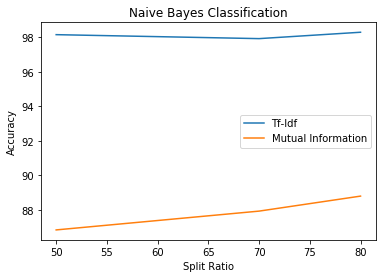

In [39]:
import matplotlib.pyplot as plt 

split_ratio = [50, 70, 80]
nb_tfidf = [98.16, 97.93, 98.3]
nb_mi = [86.84, 87.93, 88.8]

plt.plot(split_ratio, nb_tfidf, label = "Tf-Idf") 
plt.plot(split_ratio, nb_mi, label = "Mutual Information") 

plt.xlabel('Split Ratio') 
plt.ylabel('Accuracy') 
plt.title('Naive Bayes Classification') 
plt.legend() 
plt.show() 


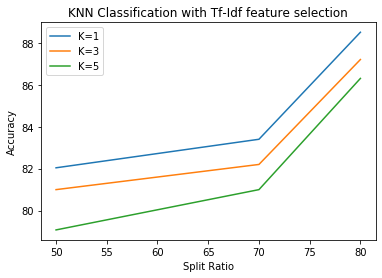

In [40]:
knn_1_tfidf = [82.04, 83.4, 88.5]
knn_3_tfidf = [81, 82.2, 87.2]
knn_5_tfidf = [79.08, 81, 86.3]

plt.plot(split_ratio, knn_1_tfidf, label = "K=1") 
plt.plot(split_ratio, knn_3_tfidf, label = "K=3") 
plt.plot(split_ratio, knn_5_tfidf, label = "K=5") 

plt.xlabel('Split Ratio') 
plt.ylabel('Accuracy') 
plt.title('KNN Classification with Tf-Idf feature selection') 
plt.legend() 
plt.show() 

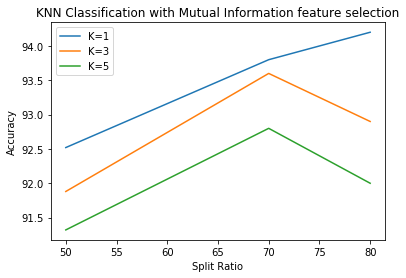

In [41]:
knn_1_mi = [92.52, 93.8, 94.2]
knn_3_mi = [91.88, 93.6, 92.9]
knn_5_mi = [91.32, 92.8, 92]

plt.plot(split_ratio, knn_1_mi, label = "K=1") 
plt.plot(split_ratio, knn_3_mi, label = "K=3") 
plt.plot(split_ratio, knn_5_mi, label = "K=5") 

plt.xlabel('Split Ratio') 
plt.ylabel('Accuracy') 
plt.title('KNN Classification with Mutual Information feature selection') 
plt.legend() 
plt.show() 